In [1]:
!pip install pandas seaborn numpy scipy scikit-learn geopandas gender-guesser plotly pandoc contextily

Defaulting to user installation because normal site-packages is not writeable


# Airbnb in New York (2019)

* airbnb dataset: https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data
* property sales newyork: https://www.kaggle.com/datasets/johnshuford/new-york-city-property-sales (it would be interesting to study profitability of airbnb based on property prices and interest rates in 2019)

In [2]:
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="white")

In [3]:
airbnb = pd.read_csv('AB_NYC_2019.csv')
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [4]:
categorical_cols = ['name', 'host_name', 'host_id', 'neighbourhood_group', 'neighbourhood', 'room_type']
numerical_cols = ['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

In [5]:
airbnb[numerical_cols].describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [6]:
airbnb[categorical_cols].astype('object').describe().transpose()

,count,unique,top,freq
name,48879,47905,Hillside Hotel,18
host_name,48874,11452,Michael,417
host_id,48895,37457,219517861,327
neighbourhood_group,48895,5,Manhattan,21661
neighbourhood,48895,221,Williamsburg,3920
room_type,48895,3,Entire home/apt,25409


## Data pre-processing

In [7]:
airbnb = airbnb.drop(columns=['last_review'])

In [8]:
airbnb[['host_name', 'name']] = airbnb[['host_name', 'name']].fillna('Unknown')
airbnb['reviews_per_month'] = airbnb['reviews_per_month'].fillna(0)
assert sum(airbnb.isna().sum()) == 0

## Simple descriptive analysis

### Visualize distribution of numerical columns

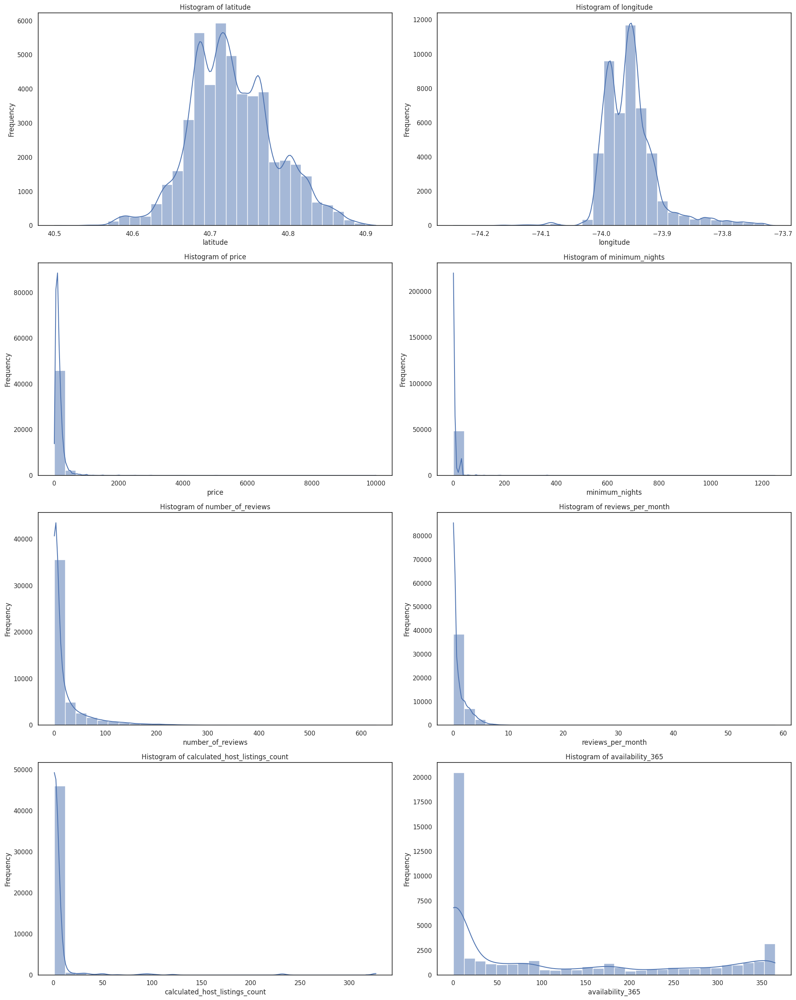

In [9]:
plt.figure(figsize=(20, 25))

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(4, 2, i)
    sns.histplot(airbnb[col], kde=True, bins=30)
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

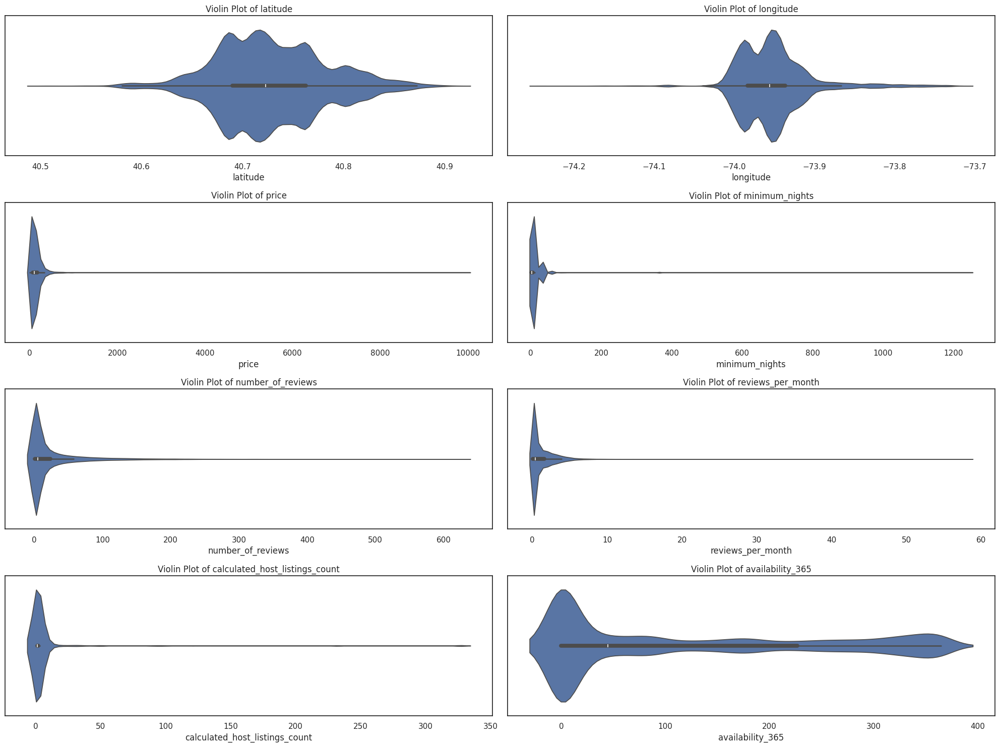

In [10]:
plt.figure(figsize=(20, 15))

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(4, 2, i)
    sns.violinplot(x=airbnb[col])
    plt.title(f'Violin Plot of {col}')
    plt.xlabel(col)

plt.tight_layout()
plt.show()

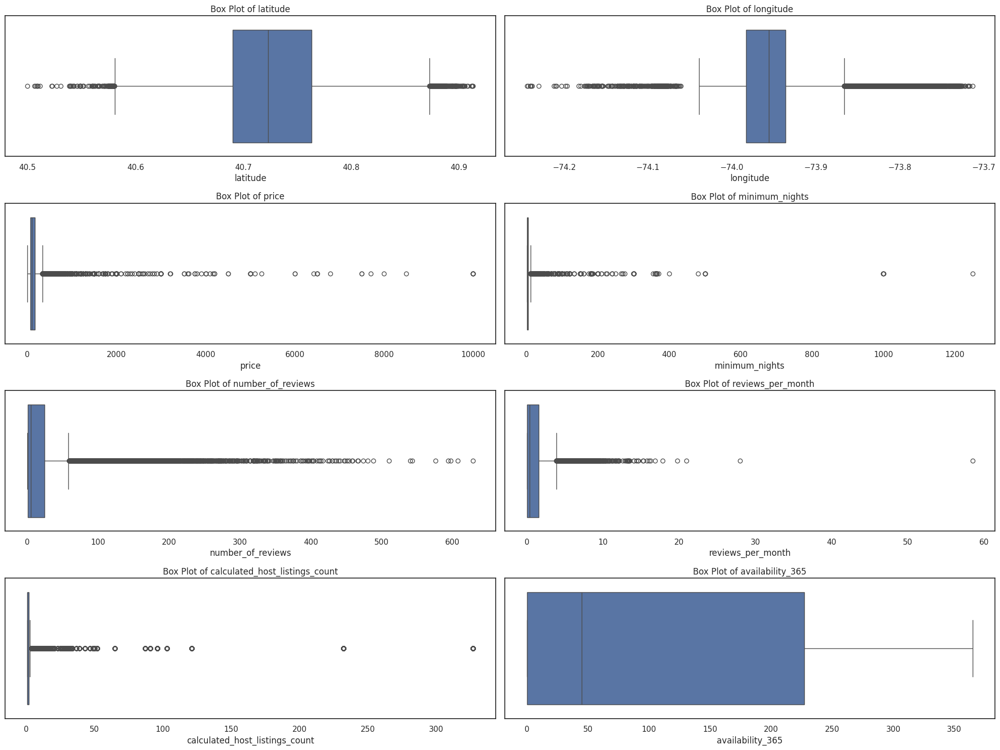

In [11]:
plt.figure(figsize=(20, 15))

for i, col in enumerate(numerical_cols, 1):
    plt.subplot(4, 2, i)
    sns.boxplot(x=airbnb[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)

plt.tight_layout()
plt.show()

### Removing skewness & outliers for numerical columns

Some of the numerical columns are highly skewed and plotting their distribution is not helpful for visualization.

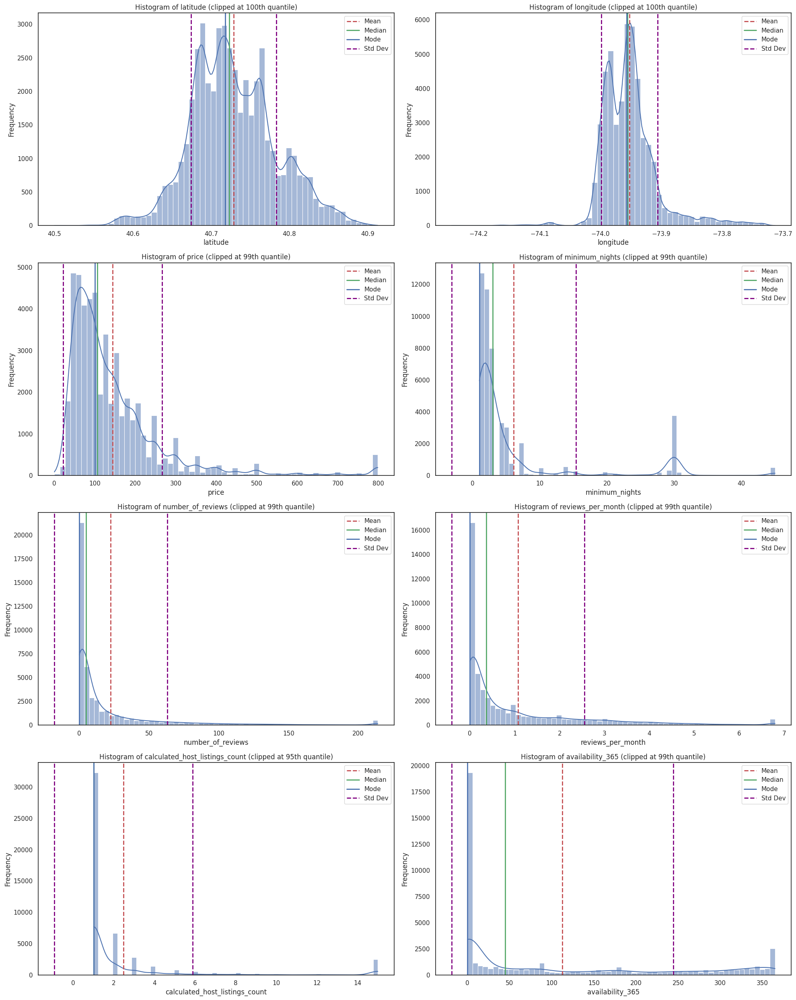

In [12]:
plt.figure(figsize=(20, 25))

cols_quantile = {
    'latitude': 1,
    'longitude': 1,
    'price': 0.99,
    'minimum_nights': 0.99,
    'number_of_reviews': 0.99,
    'reviews_per_month': 0.99,
    'calculated_host_listings_count': 0.95,
    'availability_365': 0.99,
}

for i, col in enumerate(cols_quantile.keys(), 1):
    plt.subplot(4, 2, i)
    data_clipped = airbnb[col].clip(upper=airbnb[col].quantile(cols_quantile[col]))

    airbnb[col] = data_clipped
    
    sns.histplot(data_clipped, kde=True, bins=60)
    plt.title(f'Histogram of {col} (clipped at {int(cols_quantile[col]*100)}th quantile)')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    mean = data_clipped.mean()
    median = data_clipped.median()
    mode = data_clipped.mode()[0]
    std_dev = data_clipped.std()
    
    plt.axvline(mean, color='r', linestyle='--', linewidth=2, label='Mean')
    plt.axvline(median, color='g', linestyle='-', linewidth=2, label='Median')
    plt.axvline(mode, color='b', linestyle='-', linewidth=2, label='Mode')
    plt.axvline(mean + std_dev, color='purple', linestyle='--', linewidth=2, label='Std Dev')
    plt.axvline(mean - std_dev, color='purple', linestyle='--', linewidth=2)

    plt.legend()

plt.tight_layout()
plt.show()

### Log-normality of price

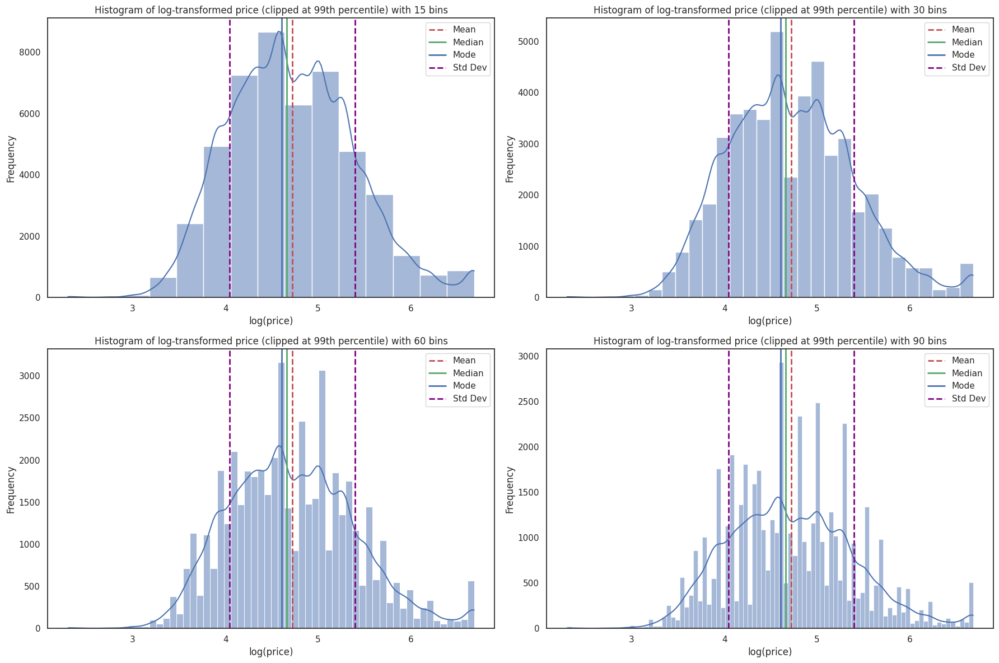

In [13]:
price_clipped = airbnb['price'].clip(upper=airbnb['price'].quantile(0.99))
log_price = np.log(price_clipped[price_clipped > 0])

bin_sizes = [15, 30, 60, 90]

plt.figure(figsize=(18, 12))

for i, bins in enumerate(bin_sizes, 1):
    plt.subplot(2, 2, i)
    sns.histplot(log_price, kde=True, bins=bins)
    plt.title(f'Histogram of log-transformed price (clipped at 99th percentile) with {bins} bins')
    plt.xlabel('log(price)')
    plt.ylabel('Frequency')

    mean_log_price = log_price.mean()
    median_log_price = log_price.median()
    mode_log_price = log_price.mode()[0]
    std_dev = log_price.std()

    
    plt.axvline(mean_log_price, color='r', linestyle='--', linewidth=2, label='Mean')
    plt.axvline(median_log_price, color='g', linestyle='-', linewidth=2, label='Median')
    plt.axvline(mode_log_price, color='b', linestyle='-', linewidth=2, label='Mode')
    plt.axvline(mean_log_price + std_dev, color='purple', linestyle='--', linewidth=2, label='Std Dev')
    plt.axvline(mean_log_price - std_dev, color='purple', linestyle='--', linewidth=2)
    
    plt.legend()

plt.tight_layout()
plt.show()

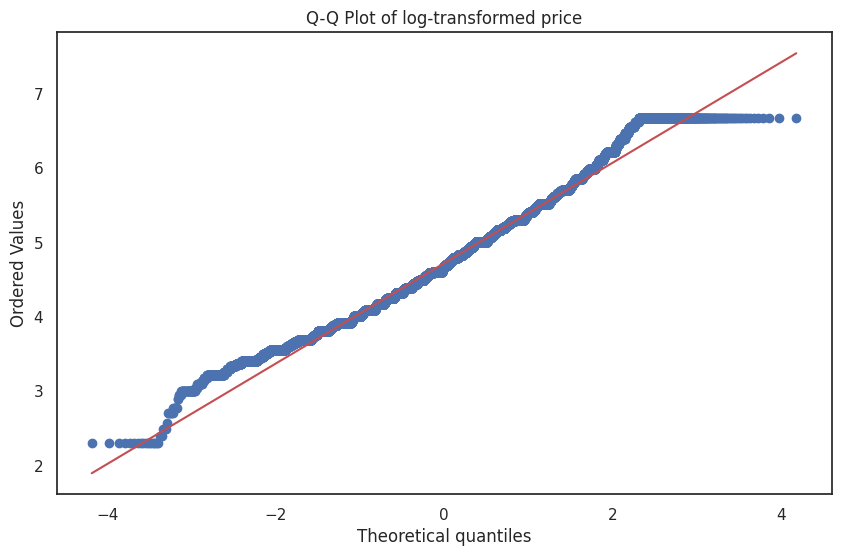

In [14]:
from scipy.stats import norm, probplot
plt.figure(figsize=(10, 6))
probplot(log_price, dist="norm", plot=plt)
plt.title('Q-Q Plot of log-transformed price')
plt.show()

### Visualize counts of categorical columns

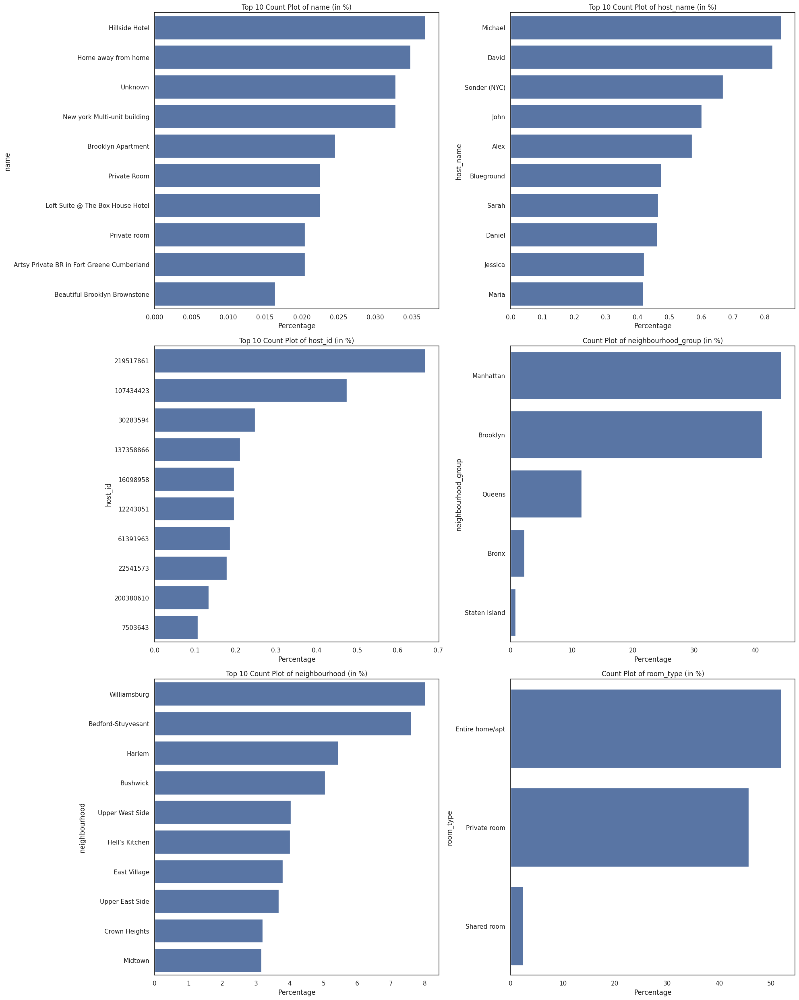

In [15]:
plt.figure(figsize=(20, 25))

for i, col in enumerate(categorical_cols, 1):
    plt.subplot(3, 2, i)
    value_counts = airbnb[col].value_counts()
    n_values = len(value_counts)
    top_n = min(10, n_values)
    top_values = value_counts.nlargest(top_n)
    total = airbnb[col].count()
    top_values_perc = (top_values / total) * 100
    sns.barplot(y=list(map(str,list(top_values_perc.index))), x=top_values_perc.values)
    
    if n_values > 10:
        plt.title(f'Top 10 Count Plot of {col} (in %)')
    else:
        plt.title(f'Count Plot of {col} (in %)')
        
    plt.xlabel('Percentage')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

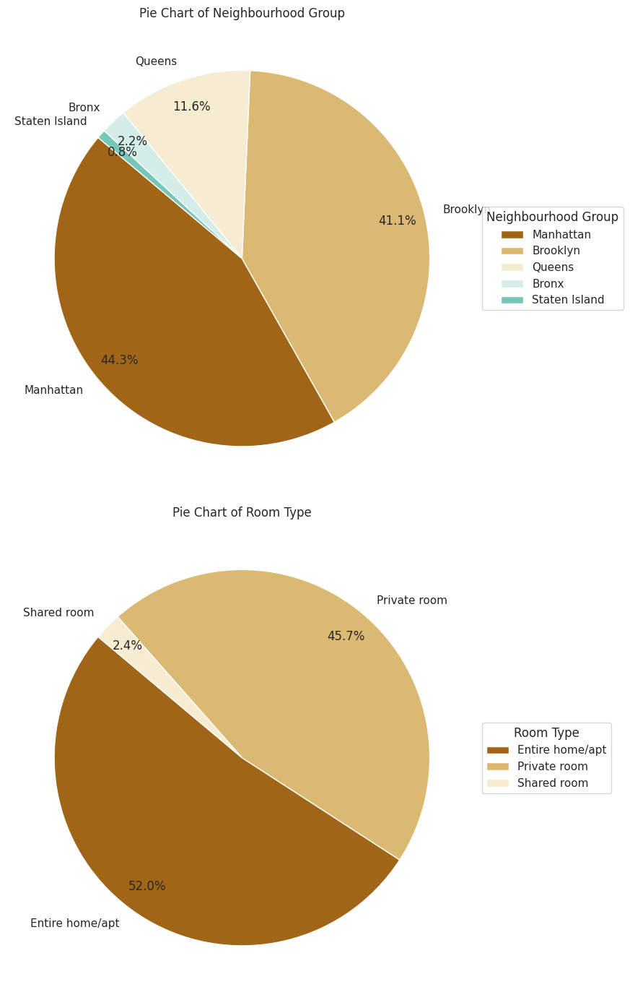

In [16]:
plt.figure(figsize=(12, 14))

plt.subplot(2, 1, 1)
neighbourhood_group_counts = airbnb['neighbourhood_group'].value_counts()
neighbourhood_pie = plt.pie(neighbourhood_group_counts, labels=neighbourhood_group_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("BrBG"), pctdistance=0.85)
plt.title('Pie Chart of Neighbourhood Group')
plt.legend(neighbourhood_pie[0], neighbourhood_group_counts.index, title="Neighbourhood Group", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.subplot(2, 1, 2)
room_type_counts = airbnb['room_type'].value_counts()
room_type_pie = plt.pie(room_type_counts, labels=room_type_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("BrBG"), pctdistance=0.85)
plt.title('Pie Chart of Room Type')
plt.legend(room_type_pie[0], room_type_counts.index, title="Room Type", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()

### Summary

* langitude and longitude seem normally distributed 
(any usefullness? probably not)
* all numerical columns have some outliers and we should 
keep only the 99th percentile
* the distribution of price is log-normal, as we can see
after plotting the hist of logs and the Q-Q plot
* std. is pretty high for all prices, minimum nights, number of reviews,
availability
* strange bump at 30 minimum nights
* number of reviews seem to exponentially decline
* large proportion of properties are fully booked
* most properties have only one listing
* shared rooms are out-of-fashion
* manhattan and brooklyn are the most popular

### Questions to investigate

**Business**
* what are the factors predicting the rental price most accurately?
* how can we maximize total yearly revenue?
* considering 2019's interest rates and housing prices, 
what are the expected profits of investing 
a certain amount of money in the airbnb market?

**Insights**
* how does the map of prices look like?
* what explains the frequency bump at 30 minimum nights?
* how does the map of reviews look like?
* considering male and female names, what's the distribution
of sex between hosts?
* what's the distribution of number of listings by host?
are there more individuals or corporations?

## Simple correlation analysis

### Densities of paired numerical columns

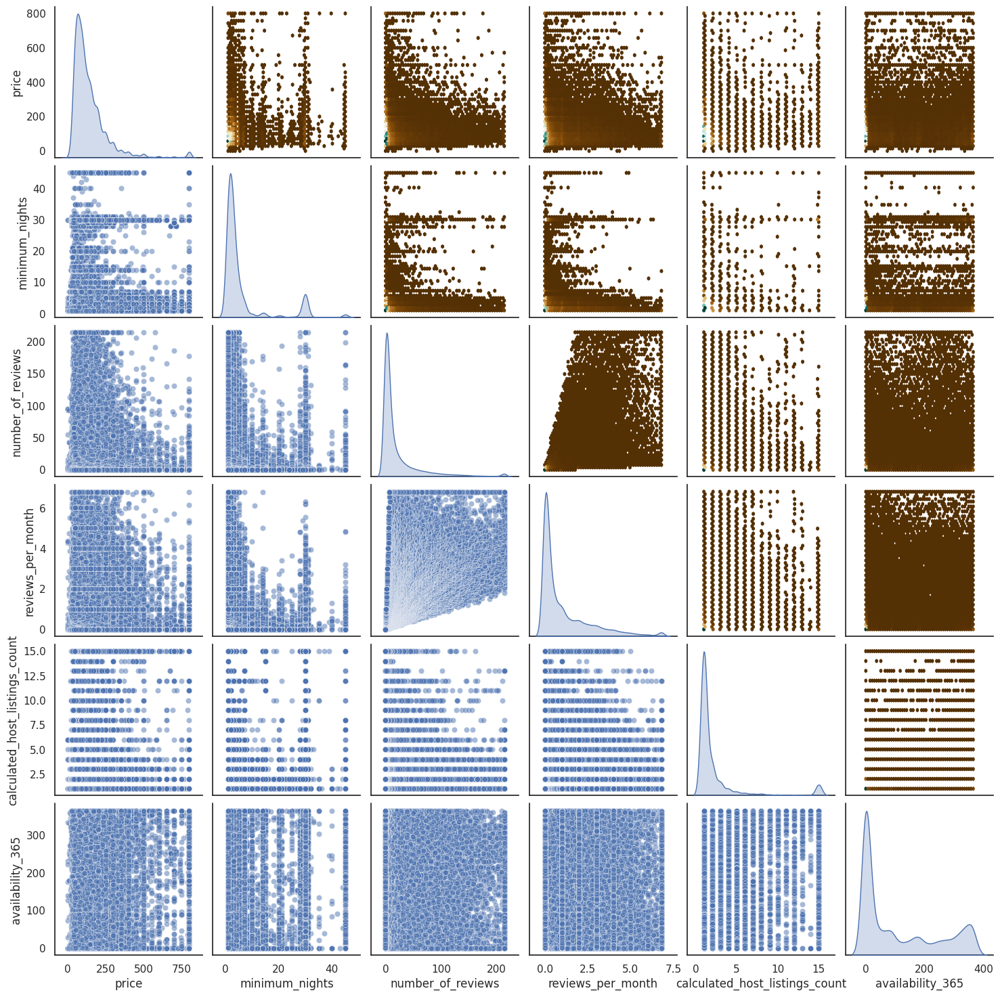

In [17]:
numeric_cols = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']
# pairplot = sns.pairplot(airbnb[numeric_cols], diag_kind='kde',plot_kws={'alpha':0.3})

g = sns.pairplot(airbnb[numeric_cols], diag_kind='kde', plot_kws={'alpha':0.5})
for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].clear()
    g.axes[i, j].hexbin(airbnb[numeric_cols[j]], airbnb[numeric_cols[i]], gridsize=50, cmap='BrBG', mincnt=1)

plt.show()

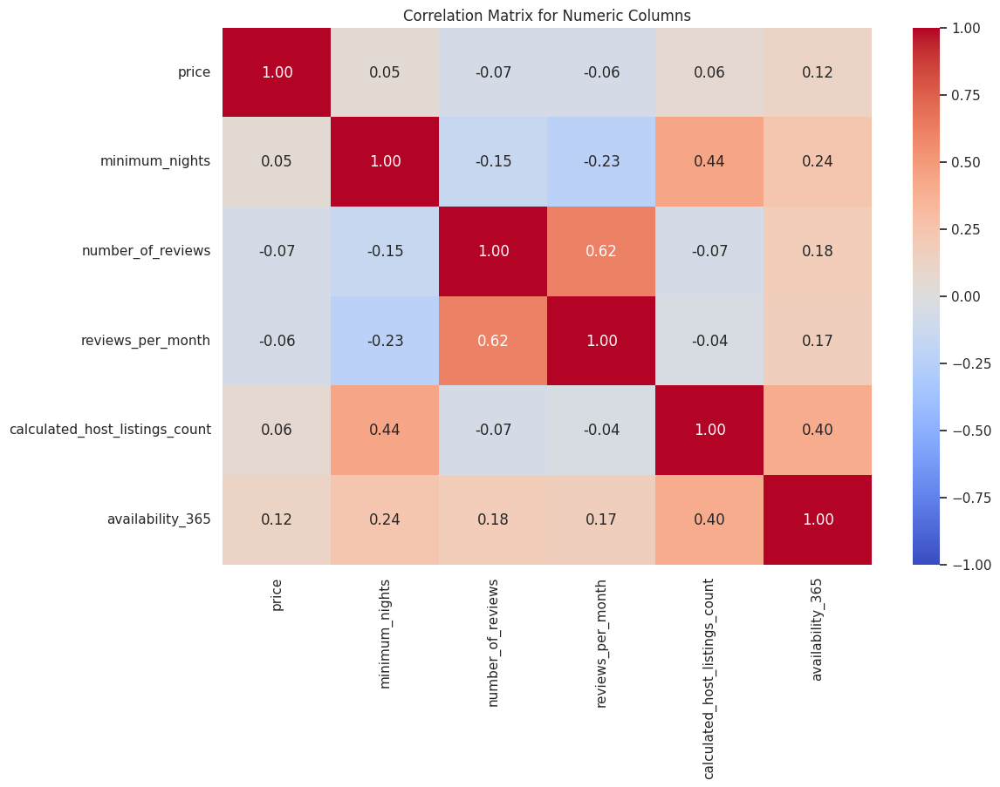

In [18]:
correlation_matrix = airbnb[numeric_cols].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, cbar=True)
plt.title('Correlation Matrix for Numeric Columns')
plt.show()

### Maps for numericals and neighbourhoods

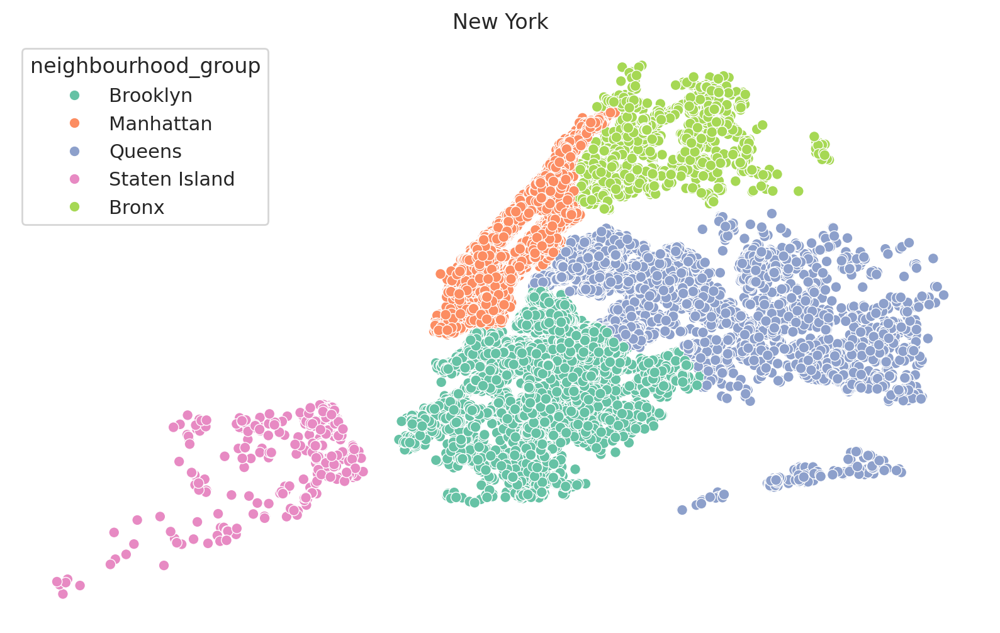

In [19]:
plt.figure(figsize=(10, 6), dpi=200)
ax = sns.scatterplot(data=airbnb, x='longitude', y='latitude', hue='neighbourhood_group', palette='Set2')
ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])
plt.title("New York")
plt.savefig('map1.png', transparent=True)
plt.show()

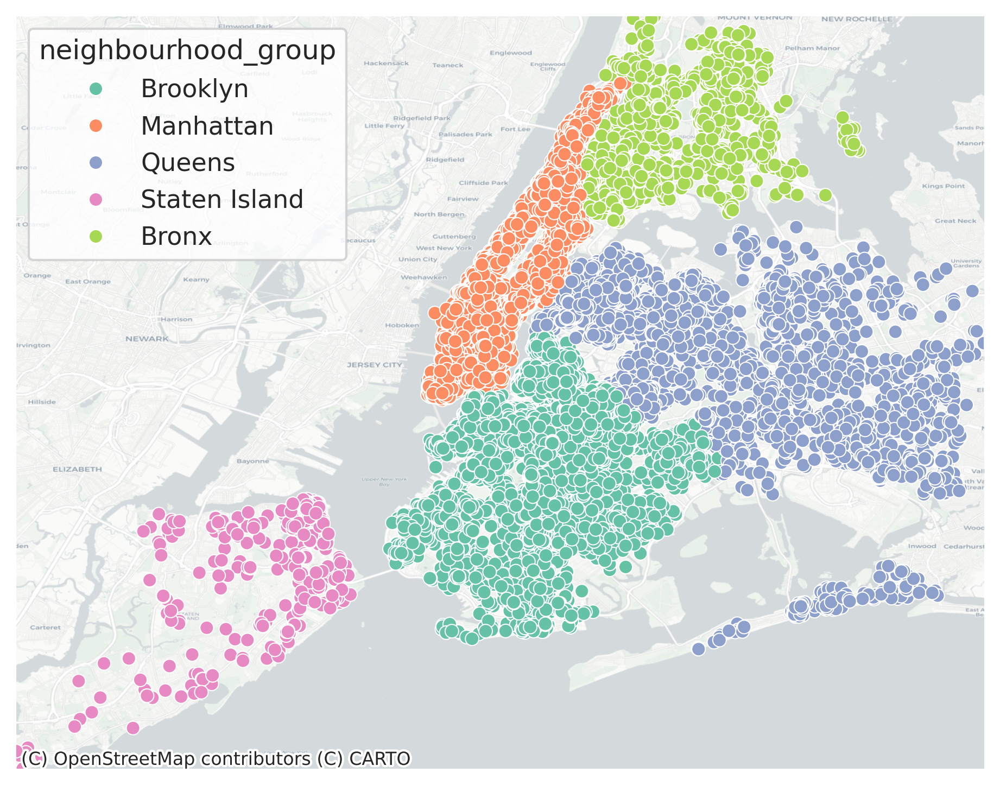

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx

# Your data setup
# Replace 'airbnb' with the actual DataFrame you are using and make sure 'longitude' and 'latitude' are correct.
plt.figure(figsize=(10, 6), dpi=300)

# Create a scatter plot
ax = sns.scatterplot(data=airbnb, x='longitude', y='latitude', hue='neighbourhood_group', palette='Set2')

# Add the map
# Convert coordinates to Web Mercator for contextily
ax.set_xlim(airbnb['longitude'].min(), airbnb['longitude'].max())
ax.set_ylim(airbnb['latitude'].min(), airbnb['latitude'].max())
ax = plt.gca()

# Using a general tile provider here
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, zoom=12)

# Update plot aesthetics
ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])
plt.savefig('map1.png', transparent=True)
plt.show()

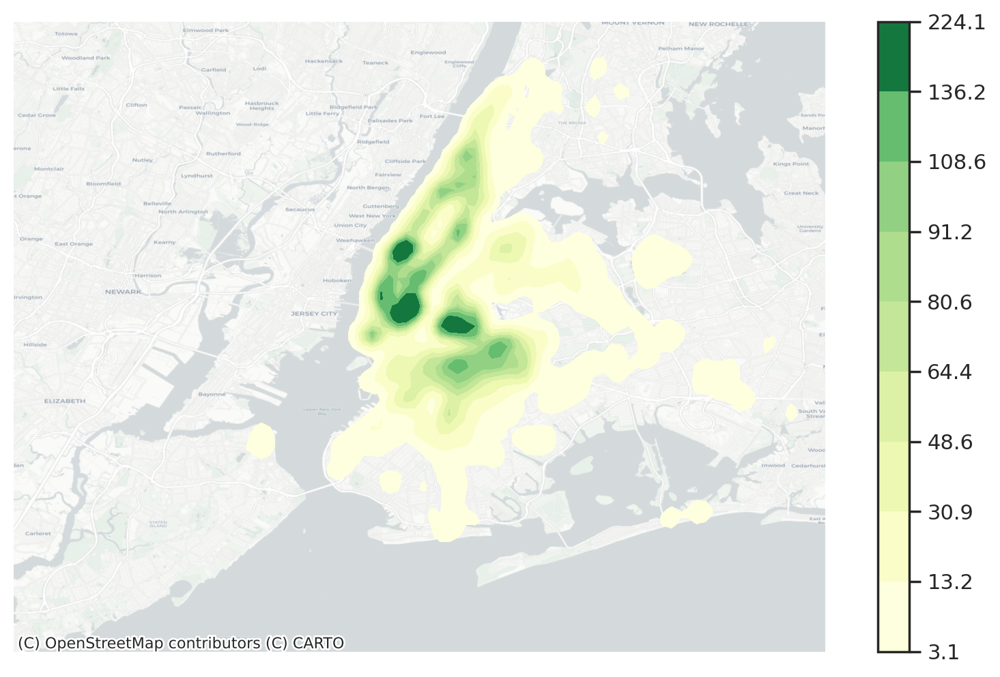

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx
import pandas as pd

# Your data setup
# Replace 'airbnb' with the actual DataFrame you are using and make sure 'longitude' and 'latitude' are correct.
plt.figure(figsize=(10, 6), dpi=200)

# Create a KDE plot and capture the result
ax = plt.gca()
kdeplot = sns.kdeplot(data=airbnb, x='longitude', y='latitude', fill=True, cmap="YlGn", gridsize=100, bw_adjust=0.5, ax=ax)

# Add the map
# Set limits for better control over the plot's extent
ax.set_xlim(airbnb['longitude'].min(), airbnb['longitude'].max())
ax.set_ylim(airbnb['latitude'].min(), airbnb['latitude'].max())

# Add basemap
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, zoom=12)

# Update plot aesthetics to focus on the density
ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])

# Add color bar for the KDE, referencing the colormap from the QuadMesh object of the kdeplot
cbar = plt.colorbar(kdeplot.collections[0], ax=ax)  # Note the use of collections[0] to access the QuadMesh

plt.savefig('kde_map_density.png', transparent=True)
plt.show()

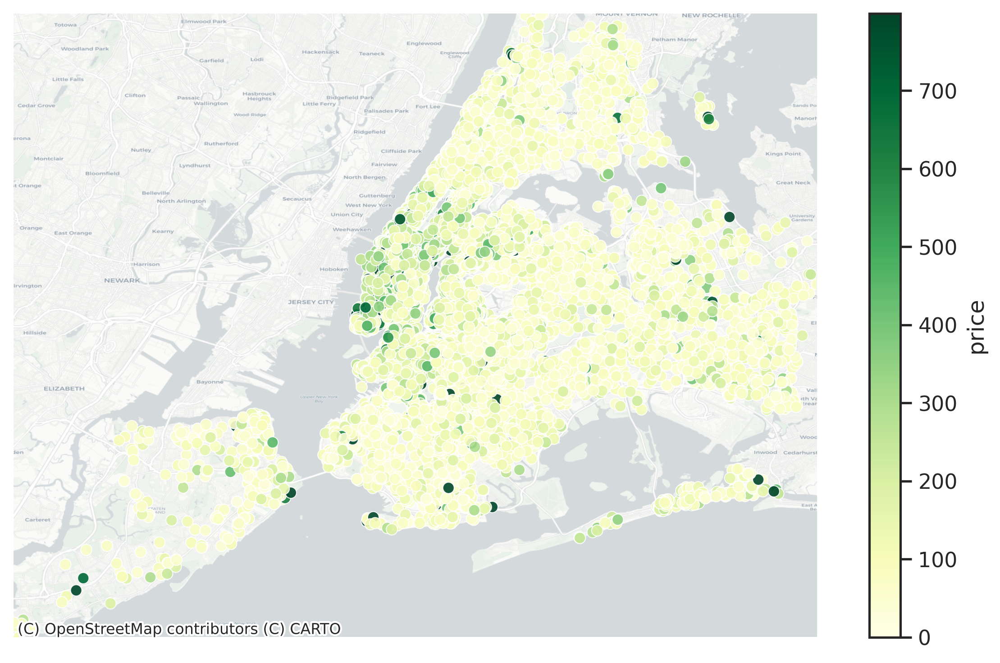

In [22]:
plt.figure(figsize=(10, 6), dpi=300)
column = 'price'
ax = sns.scatterplot(x='longitude', y='latitude', hue=column, palette='YlGn', data=airbnb, alpha=0.9)

ax.set_xlim(airbnb['longitude'].min(), airbnb['longitude'].max())
ax.set_ylim(airbnb['latitude'].min(), airbnb['latitude'].max())

# Add basemap
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, zoom=12)

norm = plt.Normalize(airbnb[column].min(), airbnb[column].max())
sm = plt.cm.ScalarMappable(cmap='YlGn', norm=norm)
sm.set_array([])
ax.get_legend().remove()
cbar = plt.colorbar(sm, ax=ax.get_figure().gca(), label=column)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])
plt.savefig('price.png', transparent=True)
plt.show()

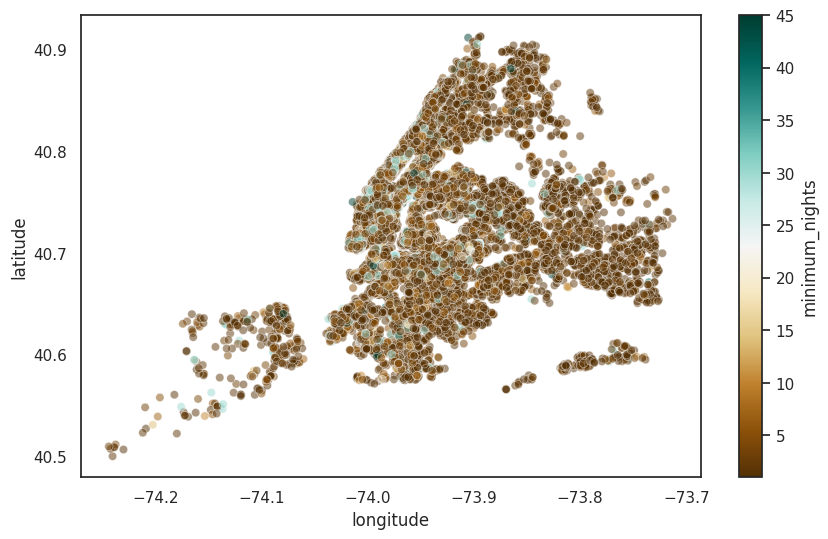

In [23]:
plt.figure(figsize=(10, 6))
column = 'minimum_nights'
scatter = sns.scatterplot(x='longitude', y='latitude', hue=column, palette='BrBG', data=airbnb, alpha=0.5)
norm = plt.Normalize(airbnb[column].min(), airbnb[column].max())
sm = plt.cm.ScalarMappable(cmap='BrBG', norm=norm)
sm.set_array([])
scatter.get_legend().remove()
cbar = plt.colorbar(sm, ax=scatter.get_figure().gca(), label=column)

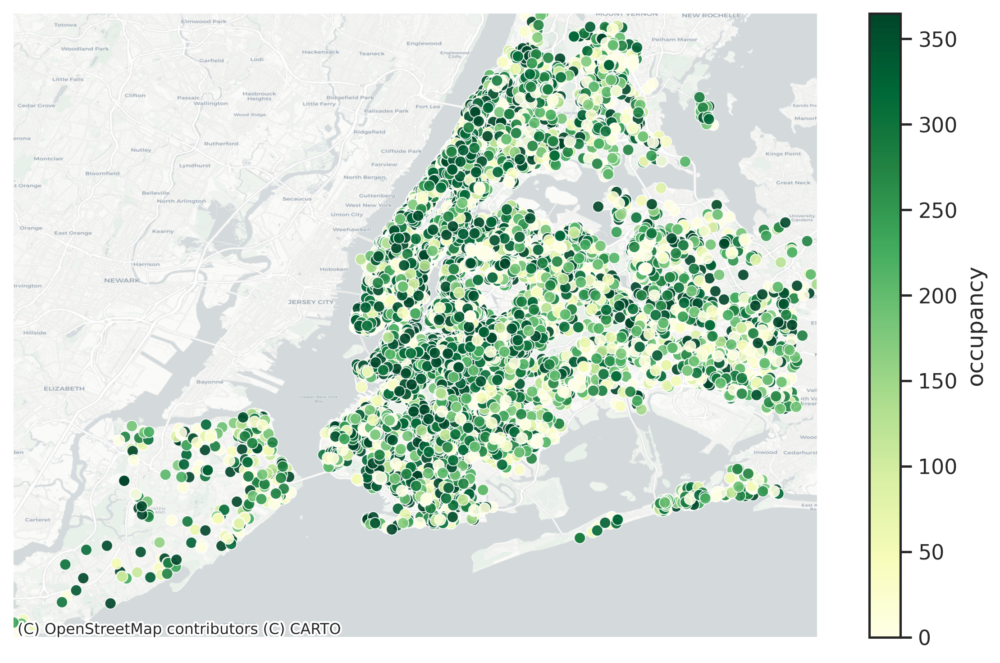

In [24]:
plt.figure(figsize=(10, 6), dpi=300)
column = 'occupancy'
airbnb[column] = 365 - airbnb['availability_365']
ax = sns.scatterplot(x='longitude', y='latitude', hue=column, palette='YlGn', data=airbnb, alpha=0.9)

ax.set_xlim(airbnb['longitude'].min(), airbnb['longitude'].max())
ax.set_ylim(airbnb['latitude'].min(), airbnb['latitude'].max())

# Add basemap
ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.Positron, zoom=12)

norm = plt.Normalize(airbnb[column].min(), airbnb[column].max())
sm = plt.cm.ScalarMappable(cmap='YlGn', norm=norm)
sm.set_array([])
ax.get_legend().remove()
cbar = plt.colorbar(sm, ax=ax.get_figure().gca(), label=column)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])
plt.savefig('occupancy.png', transparent=True)
plt.show()

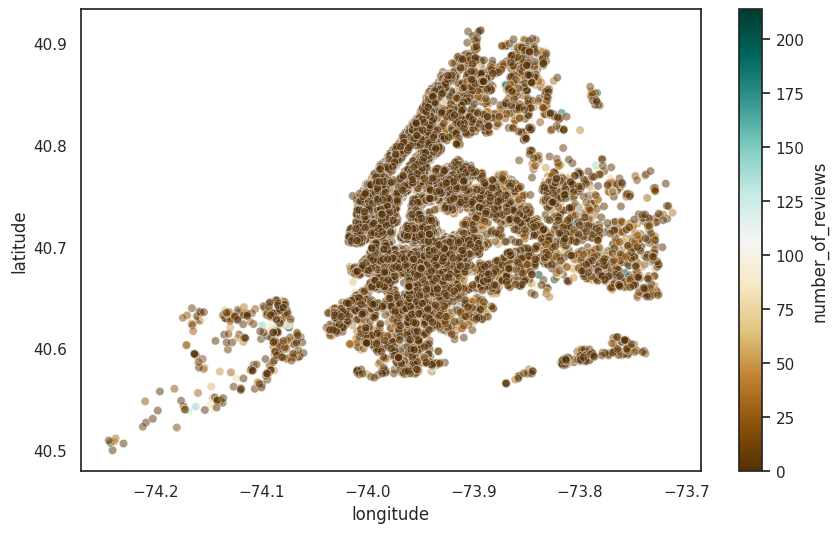

In [25]:
plt.figure(figsize=(10, 6))
column = 'number_of_reviews'
scatter = sns.scatterplot(x='longitude', y='latitude', hue=column, palette='BrBG', data=airbnb, alpha=0.5)
norm = plt.Normalize(airbnb[column].min(), airbnb[column].max())
sm = plt.cm.ScalarMappable(cmap='BrBG', norm=norm)
sm.set_array([])
scatter.get_legend().remove()
cbar = plt.colorbar(sm, ax=scatter.get_figure().gca(), label=column)

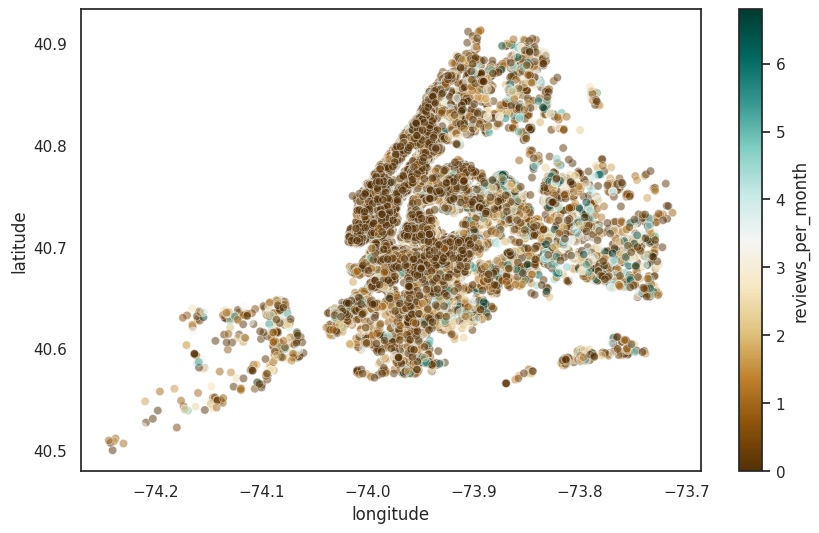

In [26]:
plt.figure(figsize=(10, 6))
column = 'reviews_per_month'
scatter = sns.scatterplot(x='longitude', y='latitude', hue=column, palette='BrBG', data=airbnb, alpha=0.5)
norm = plt.Normalize(airbnb[column].min(), airbnb[column].max())
sm = plt.cm.ScalarMappable(cmap='BrBG', norm=norm)
sm.set_array([])
scatter.get_legend().remove()
cbar = plt.colorbar(sm, ax=scatter.get_figure().gca(), label=column)

### Counts by neighbourhood groups

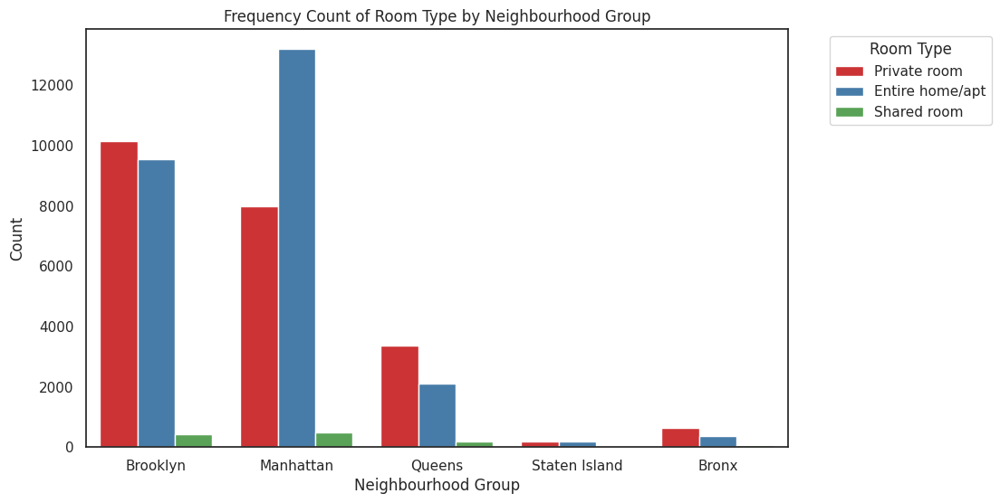

In [27]:
plt.figure(figsize=(10, 6))
sns.countplot(data=airbnb, x='neighbourhood_group', hue='room_type', palette='Set1')
plt.title('Frequency Count of Room Type by Neighbourhood Group')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Count')
plt.legend(title='Room Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

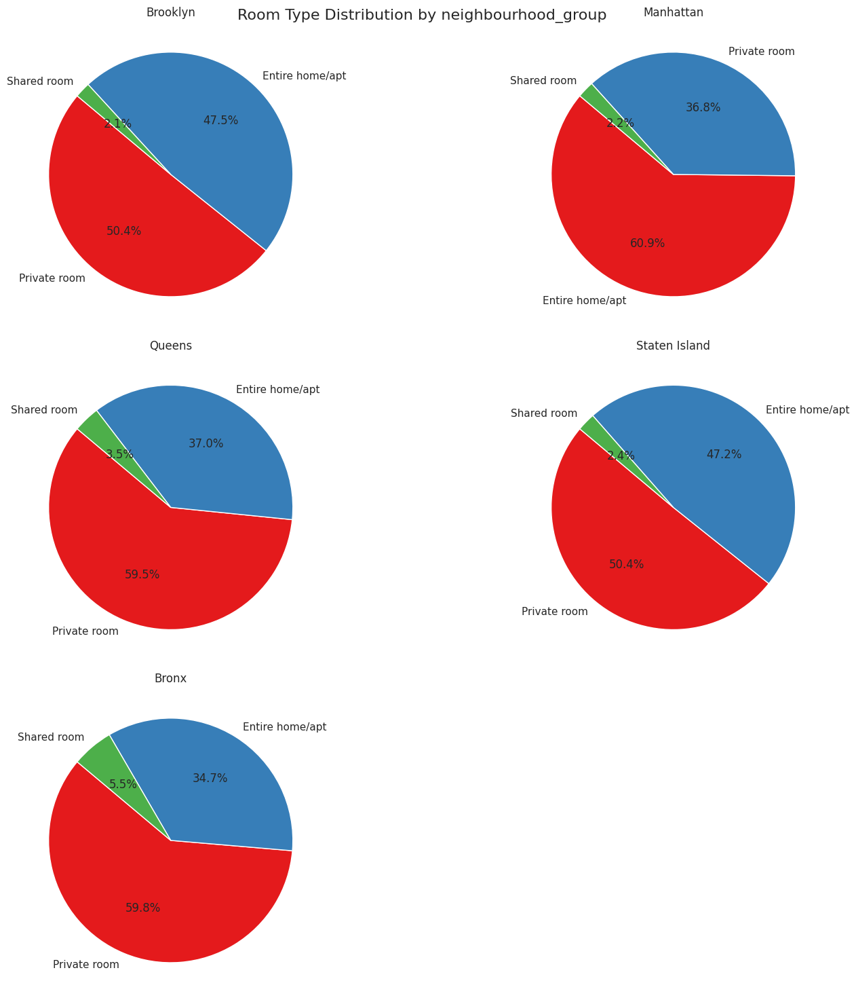

In [28]:
def plot_pie_charts_grid(data, category_column, group_column):
    groups = data[group_column].unique()
    num_groups = len(groups)
    rows = (num_groups + 1) 
    
    fig, axes = plt.subplots(rows, 2, figsize=(15, rows * 5))
    axes = axes.flatten() 
    
    for i, group in enumerate(groups):
        ax = axes[i]
        group_data = data[data[group_column] == group]
        group_counts = group_data[category_column].value_counts()
        ax.pie(group_counts, labels=group_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set1'))
        ax.set_title(f'{group}')
    
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    fig.suptitle(f'Room Type Distribution by {group_column}', fontsize=16)
    plt.tight_layout()
    plt.show()

plot_pie_charts_grid(airbnb, 'room_type', 'neighbourhood_group')

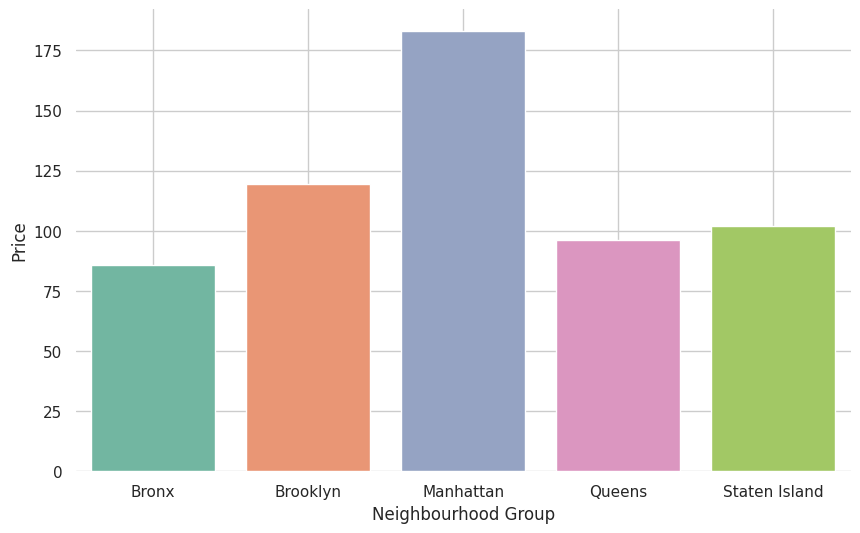

In [29]:
gx = airbnb.groupby('neighbourhood_group')['price'].mean().reset_index()

plt.figure(figsize=(10, 6))
ax = sns.barplot(data=gx, x='neighbourhood_group', y='price', hue='neighbourhood_group', palette='Set2')
# plt.title('Mean and Median Price by Neighbourhood Group')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Price')
ax.grid(True)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

plt.savefig('pricebyneighgrp.png', transparent=True)
plt.show()

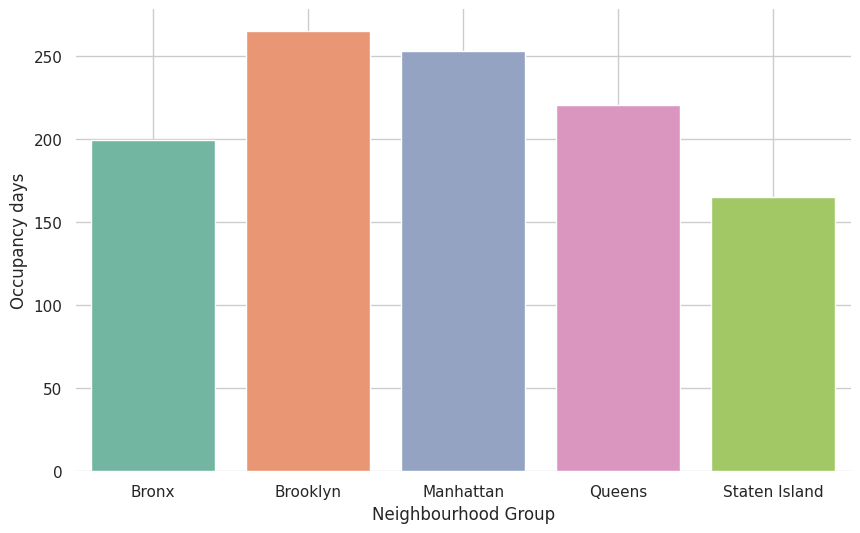

In [30]:
gx = airbnb.groupby('neighbourhood_group')['occupancy'].mean().reset_index()

plt.figure(figsize=(10, 6))
ax = sns.barplot(data=gx, x='neighbourhood_group', y='occupancy', hue='neighbourhood_group', palette='Set2')
# plt.title('Mean and Median Price by Neighbourhood Group')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Occupancy days')
ax.grid(True)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

plt.savefig('occbygrp.png', transparent=True)
plt.show()

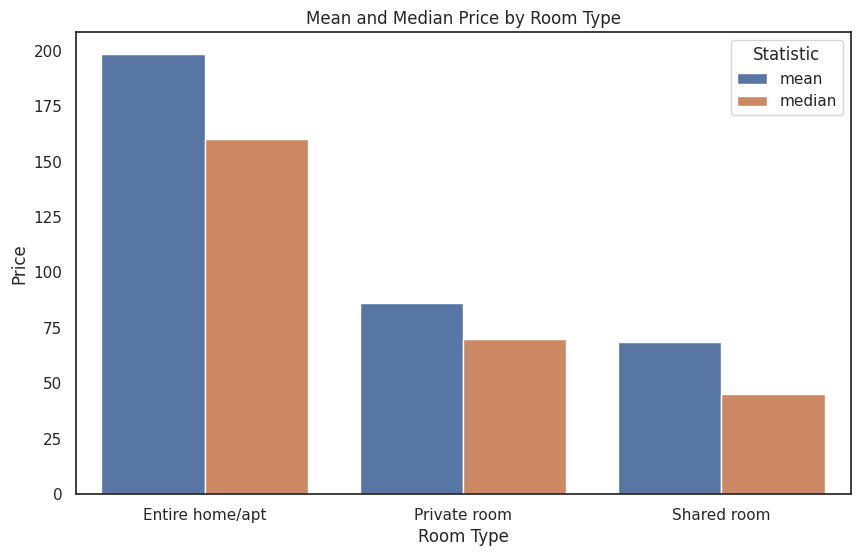

In [31]:
mean_prices = airbnb.groupby('room_type')['price'].mean().reset_index()
mean_prices['stat'] = 'mean'

median_prices = airbnb.groupby('room_type')['price'].median().reset_index()
median_prices['stat'] = 'median'

prices = pd.concat([mean_prices, median_prices])

plt.figure(figsize=(10, 6))
sns.barplot(data=prices, x='room_type', y='price', hue='stat')
plt.title('Mean and Median Price by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Price')
plt.legend(title='Statistic', loc='upper right')
plt.show()

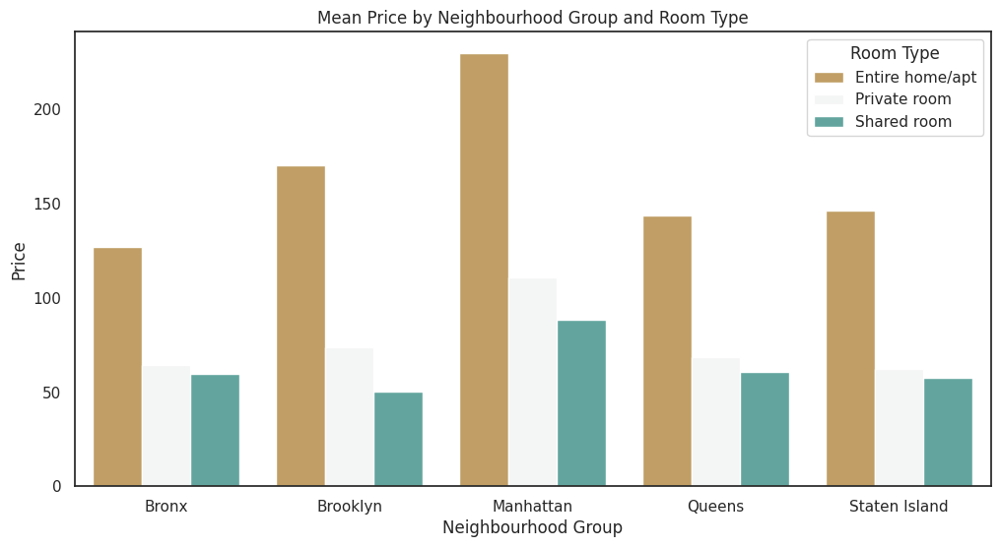

In [32]:
mean_price = airbnb.groupby(['neighbourhood_group', 'room_type'])['price'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(data=mean_price, x='neighbourhood_group', y='price', hue='room_type', palette='BrBG')
plt.title('Mean Price by Neighbourhood Group and Room Type')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Price')
plt.legend(title='Room Type', loc='upper right')
plt.show()

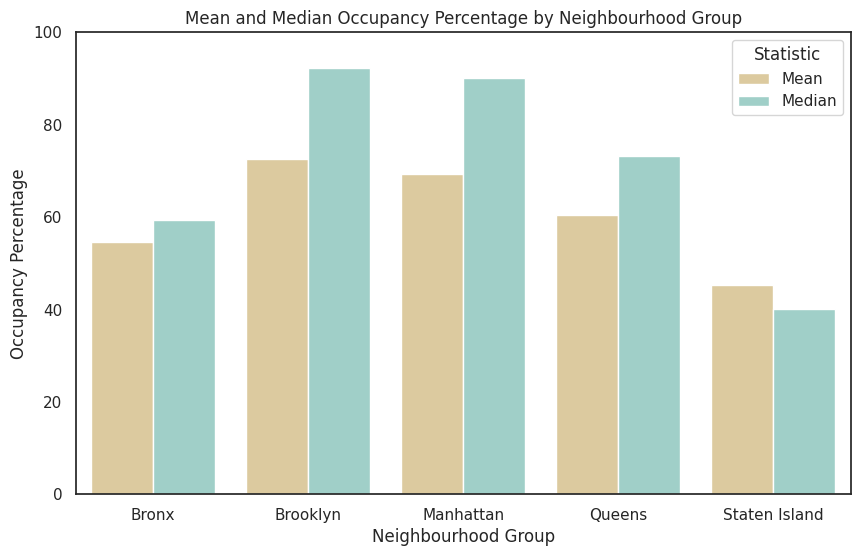

In [33]:
airbnb['occupancy_percentage'] = (365 - airbnb['availability_365']) / 365 * 100

mean_occupancy_percentage = airbnb.groupby('neighbourhood_group')['occupancy_percentage'].mean().reset_index()
mean_occupancy_percentage['Statistic'] = 'Mean'

median_occupancy_percentage = airbnb.groupby('neighbourhood_group')['occupancy_percentage'].median().reset_index()
median_occupancy_percentage['Statistic'] = 'Median'

occupancy_percentage = pd.concat([mean_occupancy_percentage, median_occupancy_percentage])

plt.figure(figsize=(10, 6))
sns.barplot(data=occupancy_percentage, x='neighbourhood_group', y='occupancy_percentage', hue='Statistic', palette='BrBG')
plt.title('Mean and Median Occupancy Percentage by Neighbourhood Group')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Occupancy Percentage')
plt.ylim(0, 100)
plt.legend(title='Statistic', loc='upper right')
plt.show()

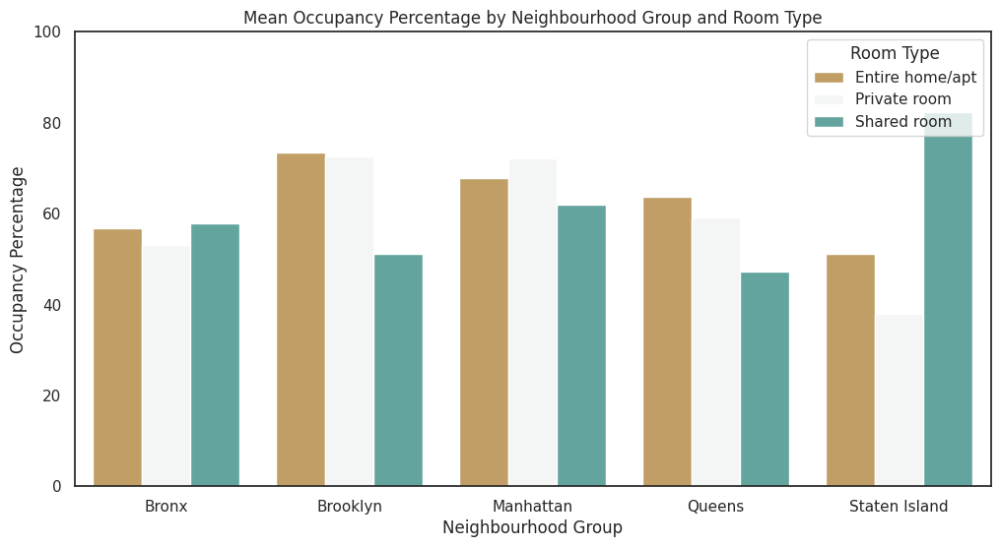

In [34]:
mean_occupancy_percentage = airbnb.groupby(['neighbourhood_group', 'room_type'])['occupancy_percentage'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(data=mean_occupancy_percentage, x='neighbourhood_group', y='occupancy_percentage', hue='room_type', palette='BrBG')
plt.title('Mean Occupancy Percentage by Neighbourhood Group and Room Type')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Occupancy Percentage')
plt.ylim(0, 100)
plt.legend(title='Room Type', loc='upper right')
plt.show()

### Analysis by host

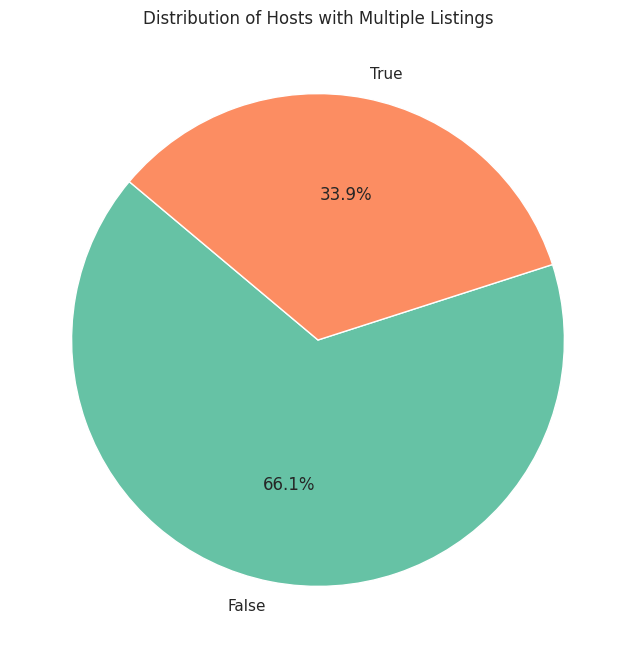

In [35]:
airbnb['multiple_listings'] = airbnb['calculated_host_listings_count'] > 1

multiple_listings_counts = airbnb['multiple_listings'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(multiple_listings_counts, labels=multiple_listings_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2'))
plt.title('Distribution of Hosts with Multiple Listings')
plt.show()

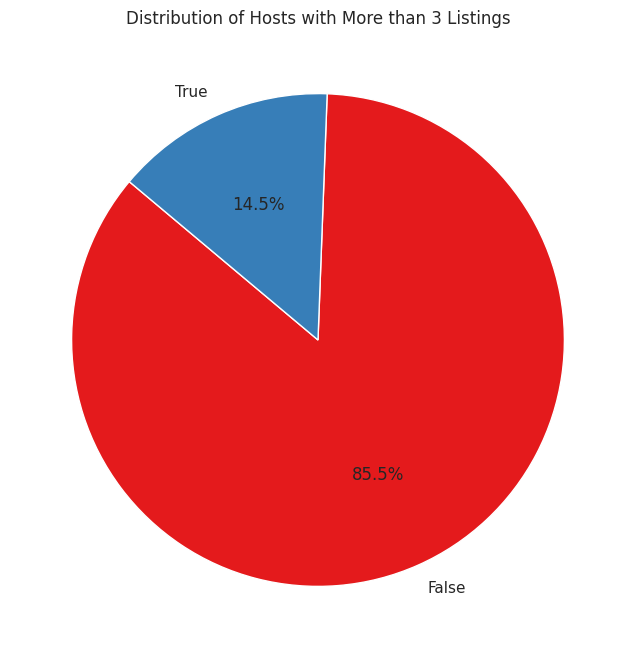

In [36]:
airbnb['multiple_listings'] = airbnb['calculated_host_listings_count'] > 3

multiple_listings_counts = airbnb['multiple_listings'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(multiple_listings_counts, labels=multiple_listings_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set1'))
plt.title('Distribution of Hosts with More than 3 Listings')
plt.show()

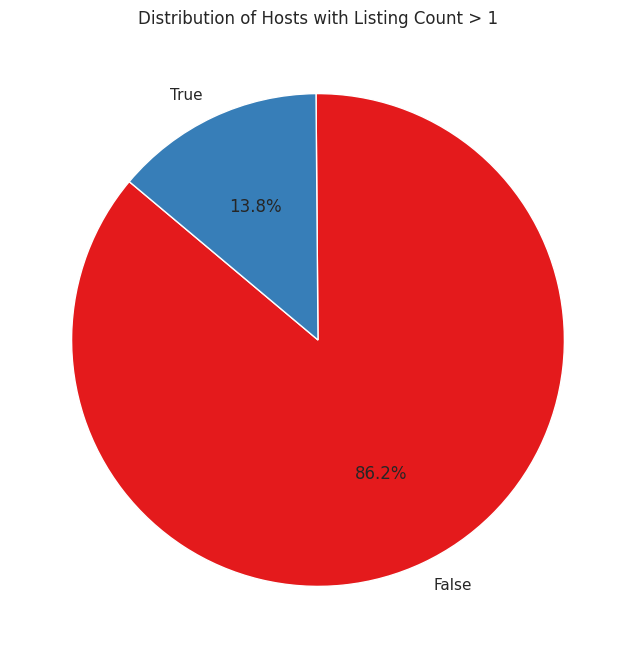

In [37]:
host_listing_counts = airbnb.groupby('host_id')['calculated_host_listings_count'].max()
hosts_with_multiple_listings = host_listing_counts > 1
hosts_with_multiple_listings_counts = hosts_with_multiple_listings.value_counts()

plt.figure(figsize=(8, 8))
plt.pie(hosts_with_multiple_listings_counts, labels=hosts_with_multiple_listings_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set1'))
plt.title('Distribution of Hosts with Listing Count > 1')
plt.show()

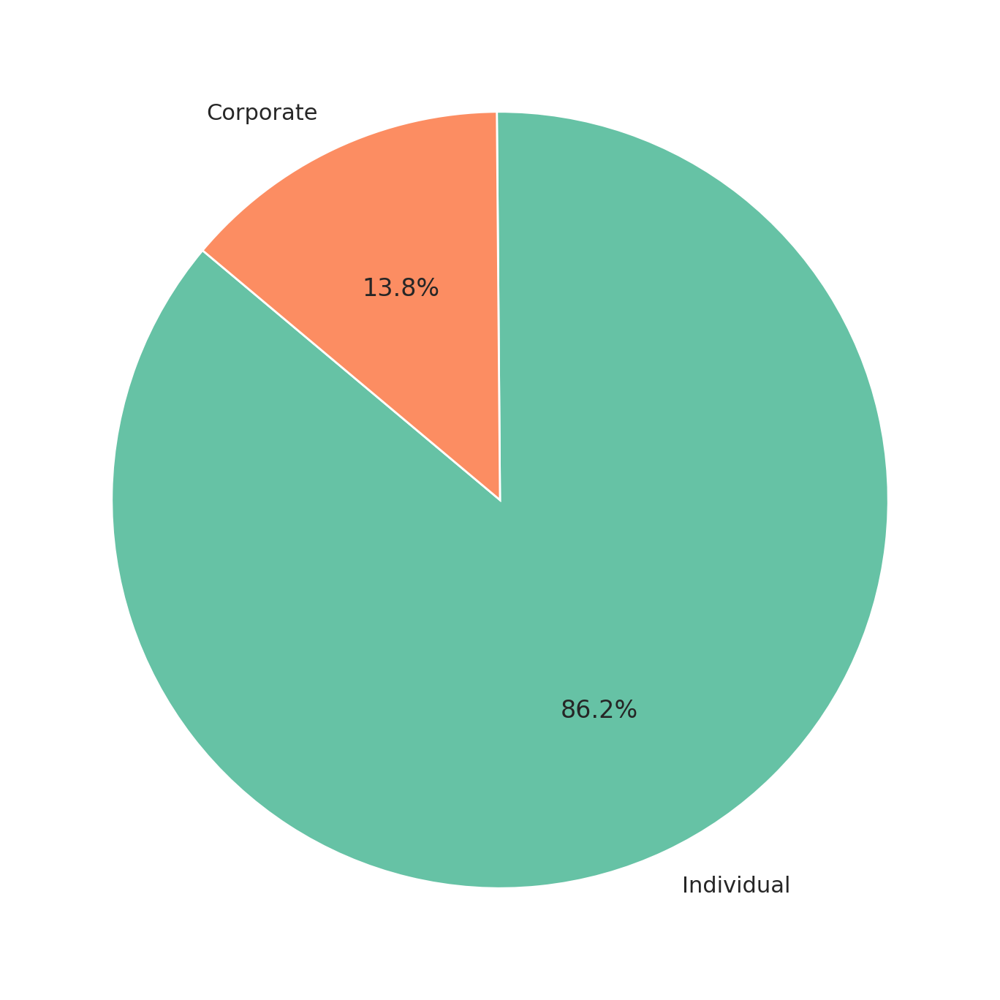

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Setup for data
# Assuming 'airbnb' DataFrame includes 'neighbourhood_group' along with 'host_id' and 'calculated_host_listings_count'.

# Filter data for Brooklyn and Manhattan
brooklyn_data = airbnb[airbnb['neighbourhood_group'] == 'Brooklyn']
manhattan_data = airbnb[airbnb['neighbourhood_group'] == 'Manhattan']

# Function to classify and count hosts
def classify_hosts(data):
    host_listing_counts = data.groupby('host_id')['calculated_host_listings_count'].max()
    hosts_with_multiple_listings = host_listing_counts > 1
    # Map True/False to 'Corporate'/'Individual'
    host_types = hosts_with_multiple_listings.map({True: 'Corporate', False: 'Individual'})
    return host_types.value_counts()

# Get counts for each type
counts = classify_hosts(airbnb)

# Create subplots for the pie charts
plt.figure(figsize=(14, 7), dpi=200)

# Brooklyn pie chart
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2'))

# Show the plots
plt.tight_layout()
plt.savefig('corporate.png', transparent=True)
plt.show()

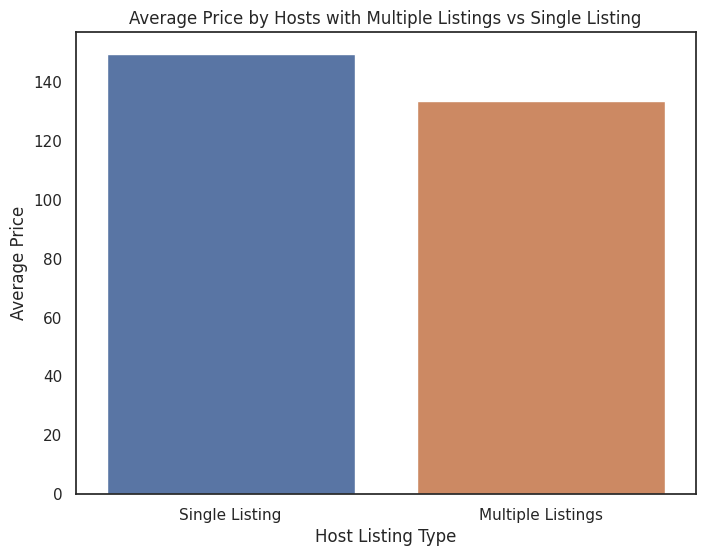

In [39]:
host_listing_counts = airbnb.groupby('host_id')['calculated_host_listings_count'].max()
hosts_with_multiple_listings = host_listing_counts > 1

airbnb['host_multiple_listings'] = airbnb['host_id'].map(hosts_with_multiple_listings)

average_price_by_listing_count = airbnb.groupby('host_multiple_listings')['price'].mean().reset_index()
average_price_by_listing_count['host_multiple_listings'] = average_price_by_listing_count['host_multiple_listings'].map({True: 'Multiple Listings', False: 'Single Listing'})

plt.figure(figsize=(8, 6))
sns.barplot(data=average_price_by_listing_count, x='host_multiple_listings', y='price', hue='host_multiple_listings')
plt.title('Average Price by Hosts with Multiple Listings vs Single Listing')
plt.xlabel('Host Listing Type')
plt.ylabel('Average Price')
plt.show()

## Exploration

### What is the distribution of gender among hosts?

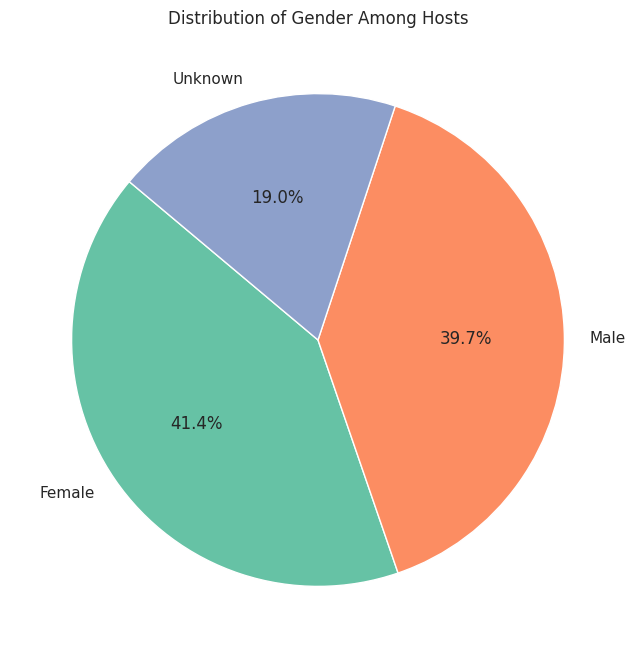

In [40]:
import gender_guesser.detector as gender
d = gender.Detector()

def guess_gender(name):
    first_name = name.split()[0]  # Use the first name only
    gender = d.get_gender(first_name)
    if gender in ['male', 'mostly_male']:
        return 'Male'
    elif gender in ['female', 'mostly_female']:
        return 'Female'
    else:
        return 'Unknown'

airbnb['host_gender'] = airbnb['host_name'].apply(guess_gender)
gender_counts = airbnb['host_gender'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2'))
plt.title('Distribution of Gender Among Hosts')
plt.show()

### What is the average revenue generated by each room type / neighbourhood group?

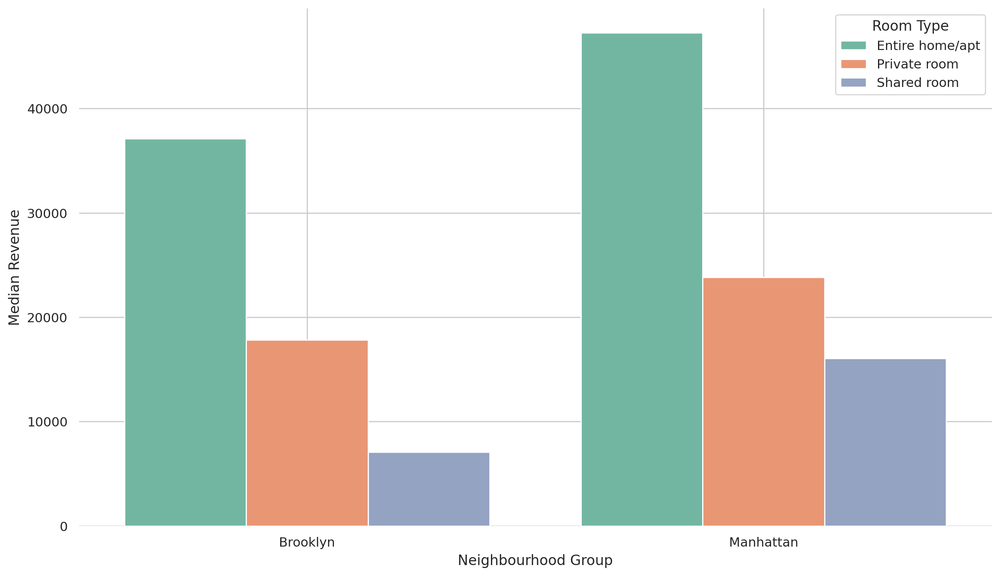

In [41]:
airbnb['occupancy'] = 365 - airbnb['availability_365']
airbnb['revenue'] = airbnb['price'] * airbnb['occupancy']

average_revenue = airbnb[airbnb['neighbourhood_group'].isin(['Manhattan', 'Brooklyn'])]
average_revenue = average_revenue.groupby(['neighbourhood_group', 'room_type'])['revenue'].median().reset_index()

plt.figure(figsize=(14, 8), dpi=200)
ax = sns.barplot(data=average_revenue, x='neighbourhood_group', y='revenue', hue='room_type', palette='Set2')
# plt.title('Average Revenue by Room Type and Neighbourhood Group')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Median Revenue')
plt.legend(title='Room Type', loc='upper right')


ax.grid(True)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

plt.savefig('roomtypes.png', transparent=True)

plt.show()

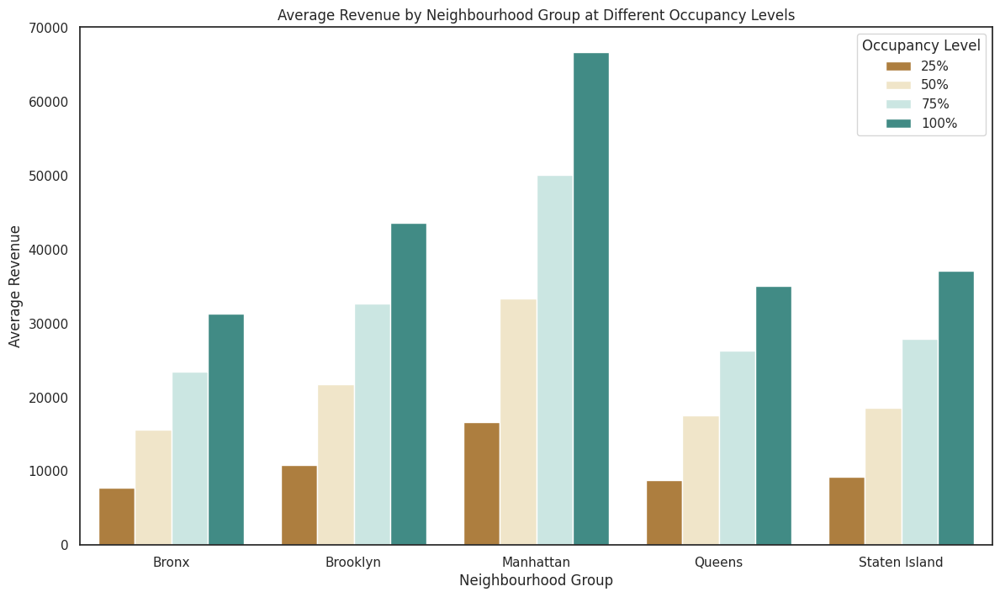

In [42]:
def calculate_average_revenue_at_occupancy(data, occupancy_levels):
    results = []
    for level in occupancy_levels:
        data['occupancy_days'] = 365 * level
        data['revenue'] = data['price'] * data['occupancy_days']
        average_revenue = data.groupby('neighbourhood_group')['revenue'].mean().reset_index()
        average_revenue['occupancy_level'] = f'{int(level*100)}%'
        results.append(average_revenue)
    return pd.concat(results)

occupancy_levels = [0.25, 0.50, 0.75, 1.00]

average_revenue_at_occupancy = calculate_average_revenue_at_occupancy(airbnb, occupancy_levels)

plt.figure(figsize=(14, 8))
sns.barplot(data=average_revenue_at_occupancy, x='neighbourhood_group', y='revenue', hue='occupancy_level', palette='BrBG')
plt.title('Average Revenue by Neighbourhood Group at Different Occupancy Levels')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Average Revenue')
plt.legend(title='Occupancy Level', loc='upper right')
plt.show()

### What is the revenue distribution in Manhattan?

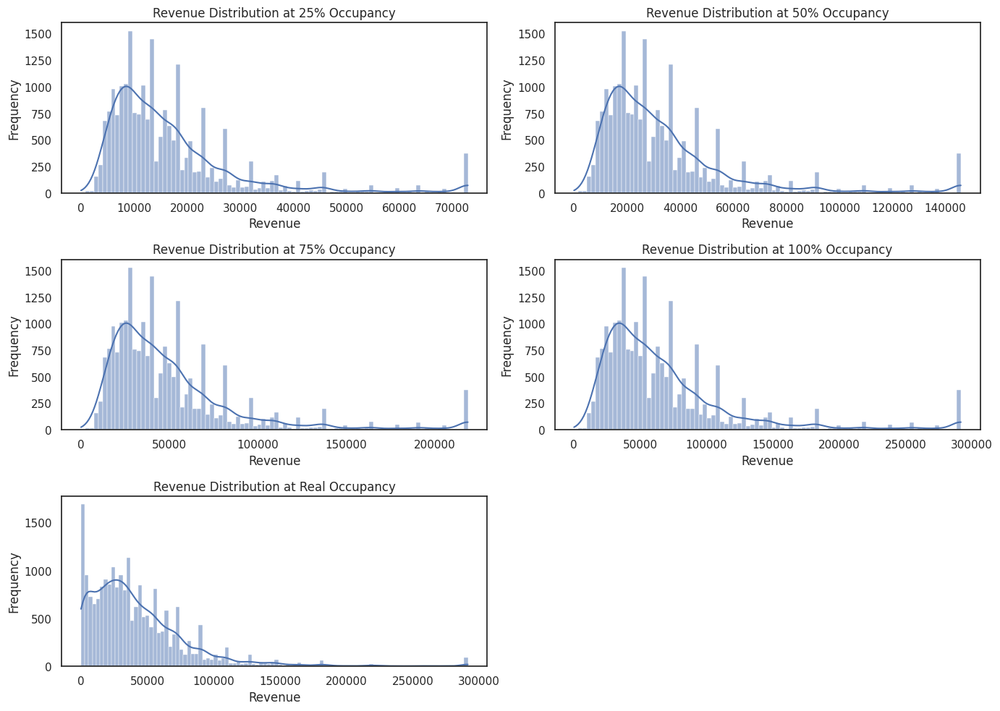

In [43]:
def calculate_revenue_at_occupancy(data, occupancy_levels):
    results = []
    for level in occupancy_levels:
        if level == -1:
            data['occupancy_days'] = 365 - data['availability_365']
            data['revenue'] = data['price'] * data['occupancy_days']
            data['occupancy_level'] = f'Real'
            results.append(data.copy())
            continue
        
        data['occupancy_days'] = 365 * level
        data['revenue'] = data['price'] * data['occupancy_days']
        data['occupancy_level'] = f'{int(level*100)}%'
        results.append(data.copy())
    
    return pd.concat(results)

# Define occupancy levels
occupancy_levels = [0.25, 0.50, 0.75, 1.00, -1]

# Calculate revenue at different occupancy levels
revenue_at_occupancy = calculate_revenue_at_occupancy(airbnb, occupancy_levels)

# Filter data for Manhattan
manhattan_revenue = revenue_at_occupancy[revenue_at_occupancy['neighbourhood_group'] == 'Manhattan']

# Plotting the distribution of revenue for Manhattan at different occupancy levels using histograms
plt.figure(figsize=(14, 10))

for i, level in enumerate(occupancy_levels, 1):
    plt.subplot(3, 2, i)
    level_label = "Real" if level == -1 else f'{int(level*100)}%'
    sns.histplot(manhattan_revenue[manhattan_revenue['occupancy_level'] == level_label]['revenue'], kde=True)
    plt.title(f'Revenue Distribution at {level_label} Occupancy')
    plt.xlabel('Revenue')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### How many properties are not occupied at all in Manhattan?

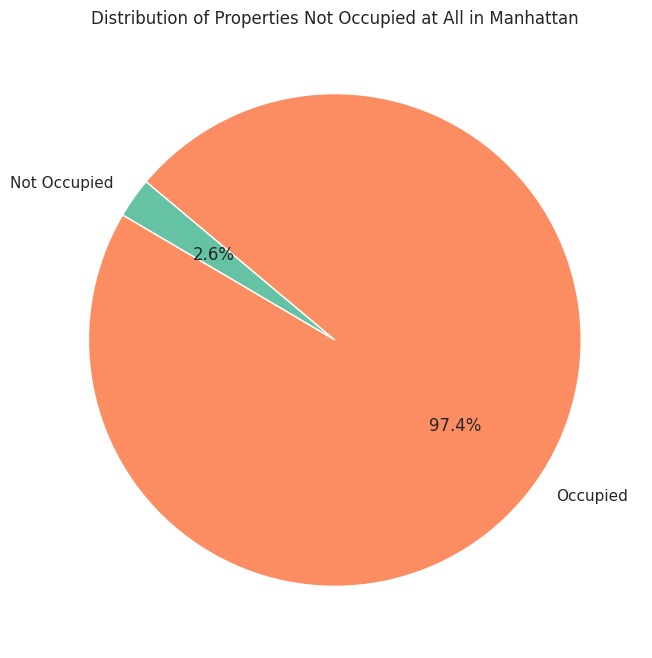

In [44]:
airbnb['occupancy'] = 365 - airbnb['availability_365']

manhattan_data = airbnb[airbnb['neighbourhood_group'] == 'Manhattan']

not_occupied_count = (manhattan_data['occupancy'] == 0).sum()
occupied_count = (manhattan_data['occupancy'] > 0).sum()

occupancy_counts = pd.DataFrame({
    'Status': ['Not Occupied', 'Occupied'],
    'Count': [not_occupied_count, occupied_count]
})

plt.figure(figsize=(8, 8))
plt.pie(occupancy_counts['Count'], labels=occupancy_counts['Status'], autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2'))
plt.title('Distribution of Properties Not Occupied at All in Manhattan')
plt.show()

### What variables best explain the price?

In [45]:
airbnb = airbnb.drop(columns=['occupancy', 'occupancy_percentage', 'occupancy_days', 'occupancy_level', 'revenue'])

In [46]:
airbnb['occupancy'] = (365 - airbnb['availability_365']) / 365
airbnb['revenue'] = airbnb['price'] * (365 - airbnb['availability_365'])

In [47]:
airbnb['revenue'].sum()

1678636834

In [48]:
airbnb.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'multiple_listings', 'host_multiple_listings', 'host_gender',
       'occupancy', 'revenue'],
      dtype='object')

Mean Squared Error: 8621.980208875859
Root Mean Squared Error: 92.85461867282564
R^2: 0.4271869905947683
Mean Price: 143.95623274363433
Variance of Price: 14867.856515759717
Std. of Price: 121.93382022949875


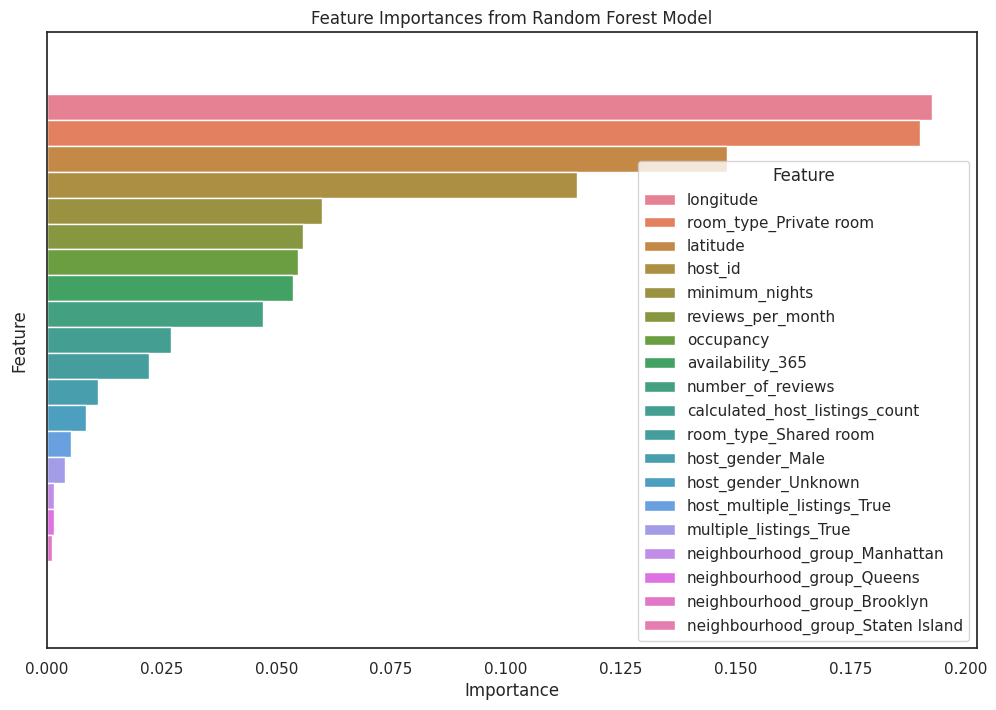

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
    
def train_rf_for(features):
    X = airbnb[features]
    y = airbnb['price']

    cat = ['neighbourhood_group', 'room_type', 'multiple_listings', 'host_multiple_listings', 'host_gender']
    cat = list(filter(lambda x: x in features, cat))
    X = pd.get_dummies(X, columns=cat, drop_first=True)
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0, stratify=airbnb['neighbourhood_group'])
    
    rf_model = RandomForestRegressor(n_estimators=100, random_state=0)
    rf_model.fit(X_train, y_train)
    
    y_pred = rf_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    price_mean = np.mean(y)
    price_var = np.var(y)
    price_std = np.std(y)
    
    print(f'Mean Squared Error: {mse}')
    print(f'Root Mean Squared Error: {rmse}')
    print(f'R^2: {r2}')
    print(f'Mean Price: {price_mean}')
    print(f'Variance of Price: {price_var}')
    print(f'Std. of Price: {price_std}')
    
    importances = rf_model.feature_importances_
    feature_names = X.columns
    
    feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    feature_importances = feature_importances.sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', hue='Feature', data=feature_importances)
    plt.title('Feature Importances from Random Forest Model')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()


train_rf_for(['host_id', 'neighbourhood_group', 'latitude', 'longitude', 'room_type', 'minimum_nights', 
            'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365',
            'multiple_listings', 'host_multiple_listings', 'host_gender', 'occupancy'])

Mean Squared Error: 0.006691349103551703
Root Mean Squared Error: 0.08180066688940685
R^2: 0.9999995554511001
Mean Price: 143.95623274363433
Variance of Price: 14867.856515759717
Std. of Price: 121.93382022949875


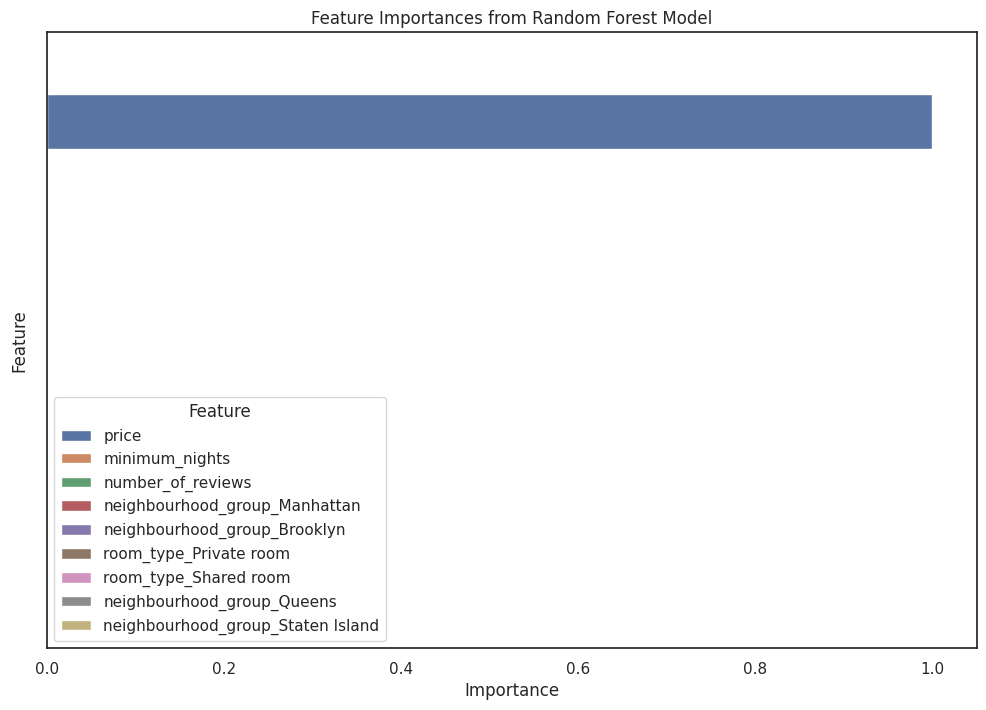

In [50]:
train_rf_for(['neighbourhood_group', 'room_type', 'minimum_nights', 'number_of_reviews', 'price'])

### If we are going to invest some money in the AirBNB business, how could we maximize our profts?

In [51]:
brooklyn_sales = pd.read_csv('2019_Brooklyn.csv')
manhattan_sales = pd.read_csv('2019_Manhattan.csv')

1043750.954357131 782500.0


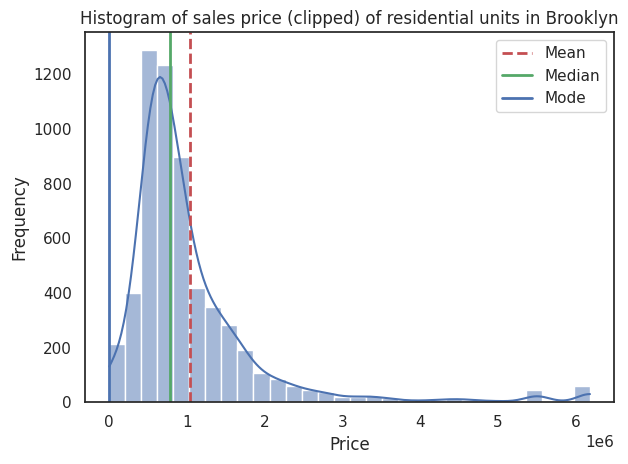

In [52]:
bins=30
sales_price = brooklyn_sales[brooklyn_sales['Residential Units'] == 1.0]['Sale Price'].dropna()
sales_price = sales_price[sales_price > 0]
sales_price = sales_price.clip(upper=sales_price.quantile(0.99))

sns.histplot(sales_price, kde=True, bins=bins)
plt.title(f'Histogram of sales price (clipped) of residential units in Brooklyn')
plt.xlabel('Price')
plt.ylabel('Frequency')

mean_price = sales_price.mean()
median_price = sales_price.median()
mode_price = sales_price.mode()[0]
std_dev = sales_price.std()


plt.axvline(mean_price, color='r', linestyle='--', linewidth=2, label='Mean')
plt.axvline(median_price, color='g', linestyle='-', linewidth=2, label='Median')
plt.axvline(mode_price, color='b', linestyle='-', linewidth=2, label='Mode')

plt.legend()

print(mean_price, median_price)
brooklyn_median = median_price

plt.tight_layout()
plt.show()

2902190.181504486 1642085.0


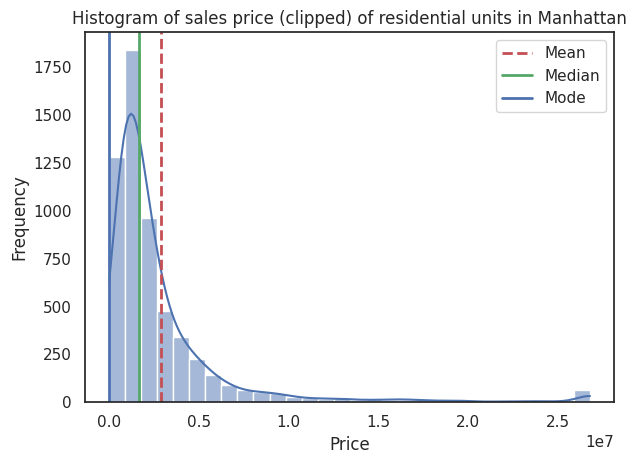

In [53]:
bins=30
sales_price = manhattan_sales[manhattan_sales['Residential Units'] == 1.0]['Sale Price'].dropna()
sales_price = sales_price[sales_price > 0]
sales_price = sales_price.clip(upper=sales_price.quantile(0.99))

sns.histplot(sales_price, kde=True, bins=bins)
plt.title(f'Histogram of sales price (clipped) of residential units in Manhattan')
plt.xlabel('Price')
plt.ylabel('Frequency')

mean_price = sales_price.mean()
median_price = sales_price.median()
mode_price = sales_price.mode()[0]
std_dev = sales_price.std()


plt.axvline(mean_price, color='r', linestyle='--', linewidth=2, label='Mean')
plt.axvline(median_price, color='g', linestyle='-', linewidth=2, label='Median')
plt.axvline(mode_price, color='b', linestyle='-', linewidth=2, label='Mode')

plt.legend()

print(mean_price, median_price)
manhattan_median = median_price

plt.tight_layout()
plt.show()

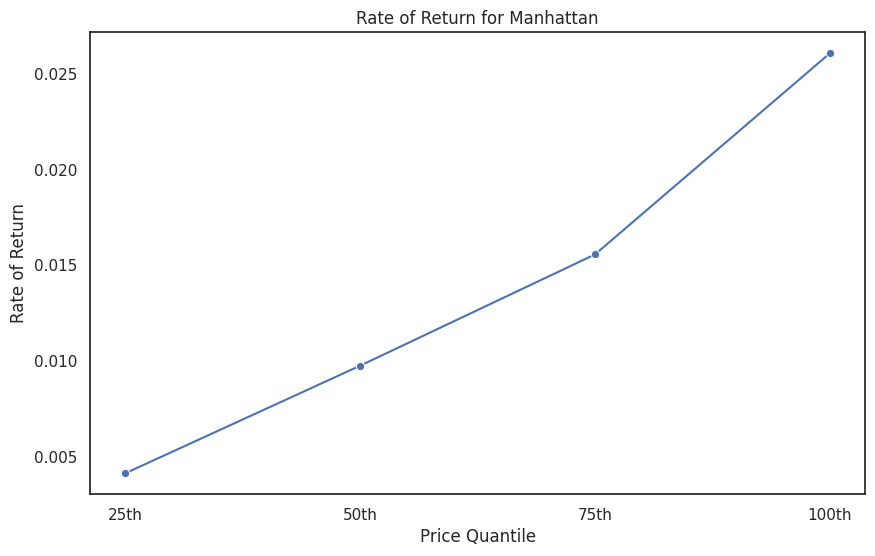

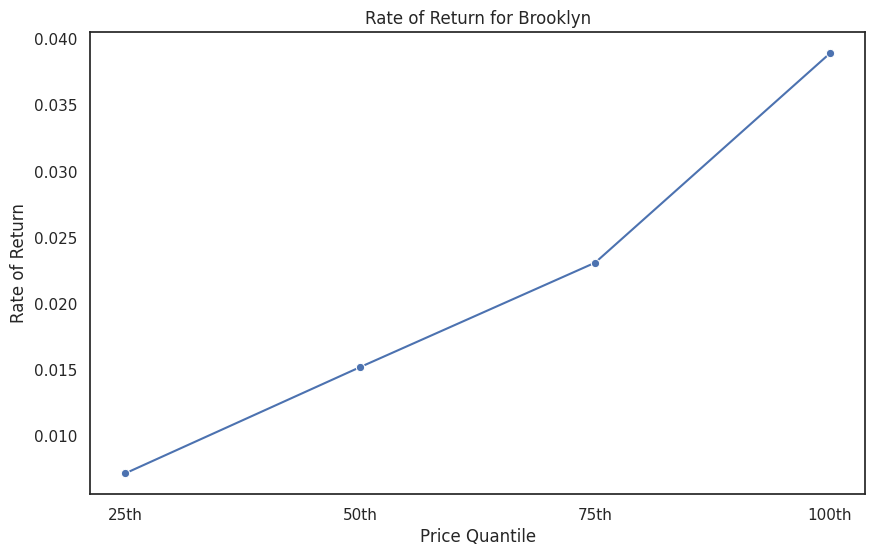

In [54]:
airbnb['rate_of_return'] = airbnb.apply(
    lambda row: row['revenue'] / manhattan_median if row['neighbourhood_group'] == 'Manhattan' else row['revenue'] / brooklyn_median, 
    axis=1
)

# Function to plot rate of return for a given neighborhood group
def plot_rate_of_return(data, neighborhood_group, median_price):
    neighborhood_data = data[data['neighbourhood_group'] == neighborhood_group]
    quantiles = neighborhood_data['revenue'].quantile([0.25, 0.5, 0.75, 1.0]).values
    return_rates = [neighborhood_data[neighborhood_data['revenue'] <= q]['rate_of_return'].mean() for q in quantiles]
    
    quantile_labels = ['25th', '50th', '75th', '100th']
    plt.figure(figsize=(10, 6))
    sns.lineplot(x=quantile_labels, y=return_rates, marker='o')
    plt.title(f'Rate of Return for {neighborhood_group}')
    plt.xlabel('Price Quantile')
    plt.ylabel('Rate of Return')
    plt.show()

# Plot rate of return for Manhattan and Brooklyn
plot_rate_of_return(airbnb, 'Manhattan', manhattan_median)
plot_rate_of_return(airbnb, 'Brooklyn', brooklyn_median)

## Final toughts

Renting vs AibBNB does not seem as an exceptional deal. Also, we did not take interest rates for loans into account.

Quote from the web for "rate of return new york renting":
```
Units priced under $750,000 yielded a median 3.3 percent return, whereas units priced over $3 million yielded a median 2.6 percent. Studio apartments generated higher yields than larger units, earning a median 3.1 percent compared to 2.6 percent and 2.5 percent for 1 and 2-bedroom rentals, respectively.
```